# Pet-project "Best car deals prediction in Finland" 

# <p style="border:3px solid DodgerBlue;text-align:center;font-size:100%;"> 
## 0. Introduction </p>
<div class="alert alert-info" role="alert">
    
<center> <img src="https://i.imgflip.com/36imay.jpg"> 
    
  WHAT IS IT ALL ABOUT?   
   
For several years I've been living in Finland and owned old but favourite BMW 5-series. Next year (in 2024) the car will turn 20 years years old so I've started thinking about buying something more young. 

<center> <img src="/Users/egor/Documents/data_science_course/project_7/img /47999191-1865-4C43-A55A-0F91BC14EEBA.jpg" alt="image" width="650" height="auto">

The main aggregator of car ads in Finland is Nettiauto.com. The website is convenient and easy to use, however, my purpose is to find the best offer that allows me to save money. I've decided to not to choose the easiest path but to apply my data science skills and build car price prediction model.


The project is divided into several parts:
- Web scraping



## Metrics
**Key metrics for this task is R2 and MSE score.**

## 0.1 Importing libraries

In [703]:
# Linear algebra
import numpy as np

import datetime
import credentials #passwords

# modules for web scraping 
import requests
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.common.by import By

# dataframe management
import pandas as pd

# regular expressions
import re

# Graphs and plots
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical tests
from statistics import mean
import statsmodels.api as sm
from scipy.stats import normaltest

# Machine learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,OneHotEncoder
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from yellowbrick.model_selection import RFECV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

# Pipelines
from joblib import dump

In [736]:
!pip freeze > requirements.txt

## 1. Getting data

### 1.1 REST API

First thing that I found was the fact that website has REST API. That was good news as collecting data via API is the most preferred way. Its key advantages are:
- Less resource-intensive, as unnecessary data is not loaded Easy integration into applications for further data processing 
- The data is already structured Bypasses an issue with dynamic page rendering
- Faster than web scraping

However, I could not generate a token using my website credentials (I have checked them and ensured that they are correct). I kept receiving error 401 "You have entered the wrong username or password. Remember that the username and password will write correctly, i.e. remember UPPERCASE and lowercase letters" (translated from finnish). 

In [2]:
data = {
    'grant_type': 'password',
    'username': credentials.username,
    'password': credentials.password,
}

response = requests.post('https://auth.nettix.fi/oauth2/token', data=data)

if response.status_code == 200:
    token_data = response.json()
    access_token = token_data.get("access_token")
    print("Access Token:", access_token)
else:
    print("Failed to obtain access token. Status code:", response.status_code)
    print("Response:", response.text)

Failed to obtain access token. Status code: 401
Response: {"error":"invalid_grant","error_description":"Olet antanut v\u00e4\u00e4r\u00e4n k\u00e4ytt\u00e4j\u00e4tunnuksen tai salasanan. Muista, ett\u00e4 k\u00e4ytt\u00e4j\u00e4tunnus ja salasana tulee kirjoittaa t\u00e4sm\u00e4lleen oikein, eli muista ISOT ja pienet kirjaimet."}


I have also tried to get access using google token (which is allowed in accordance with API documentation) but it did not work as well.

In [3]:
data = {
    'grant_type': 'google',
    'google_token': credentials.google_token
}

response = requests.post('https://auth.nettix.fi/oauth2/token', data=data)

if response.status_code == 200:
    token_data = response.json()
    access_token = token_data.get("access_token")
    print("Access Token:", access_token)
else:
    print("Failed to obtain access token. Status code:", response.status_code)
    print("Response:", response.text)

Failed to obtain access token. Status code: 500
Response: 


I thought that it won't stop me and decided to shift to web-scraping. 

### 1.2 Web scrapping

First thing I found using Requests library is that website blocks any automated requests. Response 403 means that server does not authorize such requests.

In [4]:
url = "https://www.nettiauto.com/en/vaihtoautot"
response = requests.get(url)
print(response)

<Response [403]>


In [5]:
url = 'https://www.nettiauto.com/vaihtoautot'
r = requests.get(url)
html = r.text

soup = BeautifulSoup(html, 'html.parser')

# Find all the div elements with class 'hide_list_ad_animation'
car_ad_snippets = soup.find_all('div', class_='hide_list_ad_animation')
car_ad_snippets
html


'<!DOCTYPE html><html lang="en-US"><head><title>Just a moment...</title><meta http-equiv="Content-Type" content="text/html; charset=UTF-8"><meta http-equiv="X-UA-Compatible" content="IE=Edge"><meta name="robots" content="noindex,nofollow"><meta name="viewport" content="width=device-width,initial-scale=1"><link href="/cdn-cgi/styles/challenges.css" rel="stylesheet"><meta http-equiv="refresh" content="35"></head><body class="no-js"><div class="main-wrapper" role="main"><div class="main-content"><noscript><div id="challenge-error-title"><div class="h2"><span class="icon-wrapper"><div class="heading-icon warning-icon"></div></span><span id="challenge-error-text">Enable JavaScript and cookies to continue</span></div></div></noscript></div></div><script>(function(){window._cf_chl_opt={cvId: \'2\',cZone: \'www.nettiauto.com\',cType: \'non-interactive\',cNounce: \'97513\',cRay: \'804f35559bc87b5b\',cHash: \'525396c8eeda279\',cUPMDTk: "\\/vaihtoautot?__cf_chl_tk=xTt7yc0QHfqyb.qtUa_hnGzuAM8Tpmng

In [ ]:
data_dict = {'make': [], 'desc': [], 'key_char': [], 'place': [], 'price': []}
data = pd.DataFrame(data_dict)
browser = webdriver.Chrome()
options = webdriver.ChromeOptions()
driver = webdriver.Chrome(options=options)
options.add_argument("--start-maximized")

url = f'https://www.nettiauto.com/vaihtoautot?page=4'
driver.get(url)

ads_links_list = []

# Get the page source code
page_source = driver.page_source
soup = BeautifulSoup(page_source, 'html.parser')
# Find all the div elements with class 'hide_list_ad_animation'
car_ad_snippets = soup.find_all('div', class_='hide_list_ad_animation')
for snippet in car_ad_snippets:
    anchor_tag = snippet.find('a', class_='childVifUrl')
    if anchor_tag:
        href_value = anchor_tag.get('href')
        ads_links_list.append(href_value)

# places_list = browser.find_elements(By.CSS_SELECTOR, ".hide_list_ad_animation")
browser.close()
ads_links_list



#listingData mainBlock13212417 mainBlock13826309
#mainBlock13826336
#mainBlock13212417

In [23]:
browser = webdriver.Chrome()

url = f'https://www.nettiauto.com'
browser.get(url)
all_makes = browser.find_elements(By.CSS_SELECTOR, '#srch_id_make')[0].text
browser.close()

all_makes = all_makes.replace('\n', ', ').replace('  ', '').split(', ')
all_makes = all_makes[11:-1]

all_makes

['Acura',
 'Alfa Romeo',
 'AMC',
 'Aston Martin',
 'Audi',
 'Austin',
 'Bedford',
 'Bentley',
 'BMW',
 'BMW Alpina',
 'Buick',
 'BYD',
 'Cadillac',
 'Chandler',
 'Chevrolet',
 'Chrysler',
 'Citroen',
 'Cobra',
 'Commer',
 'Cupra',
 'Dacia',
 'Daewoo',
 'Daf',
 'Daihatsu',
 'Daimler',
 'Datsun',
 'Datsun-Nissan',
 'DeSoto',
 'DKW',
 'Dodge',
 'Donau',
 'DS',
 'Edsel',
 'EMW',
 'Essex',
 'Ferrari',
 'Fiat',
 'Fiat-Abarth',
 'Fisker',
 'Ford',
 'GAZ',
 'GMC',
 'Hillman',
 'Honda',
 'Hudson',
 'Humber',
 'Hummer',
 'Hyundai',
 'Ifa',
 'Imperial',
 'Infiniti',
 'International',
 'Inzile',
 'Isuzu',
 'Iveco',
 'Jaguar',
 'Jeep',
 'Kia',
 'Lada',
 'Lamborghini',
 'Lancia',
 'Land Rover',
 'Lexus',
 'Leyland',
 'Lincoln',
 'Lloyd',
 'London taxi',
 'Lotus',
 'LuAZ',
 'Lynk & Co',
 'MAN',
 'Maserati',
 'Matra',
 'Maxus',
 'Mazda',
 'McLaren',
 'Mercedes-Benz',
 'Mercury',
 'MG',
 'Mini',
 'Mitsubishi',
 'Mitsubishi Fuso',
 'Morris',
 'Moskvitsh',
 'Muu merkki',
 'Nissan',
 'NSU',
 'Oldsmobile',

In [9]:
len(all_makes)

134

In [ ]:
len(ads_links_list)

In [318]:
data_dict = {}
data = pd.DataFrame(data_dict)
browser = webdriver.Chrome()
options = webdriver.ChromeOptions()
options.add_argument("--start-maximized")

url = f'https://www.nettiauto.com/vaihtoautot'
browser.get(url)
number_of_pages = browser.find_elements(By.CSS_SELECTOR, '#pagingData > div > span.navigation_link > a.pageNavigation.dot_block')
number_of_pages = int(number_of_pages[0].text)
print(f'Initiating web-scraping of {number_of_pages}...')
browser.close()

for page in range(1, number_of_pages+1):

    browser = webdriver.Chrome()
    options.add_argument("--start-maximized")

    url = f'https://www.nettiauto.com/vaihtoautot?page={page}'
    browser.get(url)
    make_list = browser.find_elements(By.CSS_SELECTOR, '[class="make_model_link"]')
    desc_list = browser.find_elements(By.CSS_SELECTOR, '[class="checkLnesFlat for_rent_one_line"]')
    key_char_list = browser.find_elements(By.CSS_SELECTOR, '[class="vehicle_other_info clearfix_nett"]')
    places_list = browser.find_elements(By.CSS_SELECTOR, '[class="gray_text"]')
    sellers_list = browser.find_elements(By.CSS_SELECTOR, '[class="no_wrap gray_text"]')
    price_list = browser.find_elements(By.CSS_SELECTOR, '[class="price_block"]')
    ids_list = browser.find_elements(By.CSS_SELECTOR, '[class="childVifUrl tricky_link"]')

    print(len(make_list), len(desc_list), len(key_char_list), len(places_list), len(sellers_list), len(price_list), len(ids_list))

    if len(make_list) == len(desc_list) == len(key_char_list) == len(places_list) == len(sellers_list) == len(price_list) == len(ids_list):
        makes = []
        descs = []
        key_chars = []
        places = []
        sellers = []
        prices = []
        ids = []
        
        for val in range(len(make_list)):
            makes.append(make_list[val].text)
            descs.append(desc_list[val].text)
            key_chars.append(key_char_list[val].text.replace('\n', ' | '))
            places.append(places_list[val].text)
            sellers.append(sellers_list[val].text)
            prices.append(price_list[val].text)
            ids.append(ids_list[val].get_attribute('href'))

    else:
        print('Error! Number of values in columns is different!')
        continue

    data_dict['make'] = makes
    data_dict['desc'] = descs
    data_dict['key_char'] = key_chars
    data_dict['place'] = places
    data_dict['seller'] = sellers
    data_dict['price'] = prices
    data_dict['id'] = ids
    
    data_new = pd.DataFrame(data_dict)
    data = pd.concat([data, data_new])
    data.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_291023.csv')
    print(f'Page {page} out of {number_of_pages} completed')
    browser.close()

Initiating web-scraping of 2841...
32 32 32 32 32 32 32
Page 1 out of 2841 completed
30 30 30 30 30 30 30
Page 2 out of 2841 completed
30 30 30 30 30 30 30
Page 3 out of 2841 completed
30 30 30 30 30 30 30
Page 4 out of 2841 completed


NoSuchWindowException: Message: no such window: target window already closed
from unknown error: web view not found
  (Session info: chrome=118.0.5993.117)
Stacktrace:
0   chromedriver                        0x0000000102d44510 chromedriver + 4310288
1   chromedriver                        0x0000000102d3c4bc chromedriver + 4277436
2   chromedriver                        0x000000010296fb6c chromedriver + 293740
3   chromedriver                        0x0000000102948718 chromedriver + 132888
4   chromedriver                        0x00000001029dc540 chromedriver + 738624
5   chromedriver                        0x00000001029ef6f0 chromedriver + 816880
6   chromedriver                        0x00000001029a8fd0 chromedriver + 528336
7   chromedriver                        0x00000001029a9e7c chromedriver + 532092
8   chromedriver                        0x0000000102d0a834 chromedriver + 4073524
9   chromedriver                        0x0000000102d0e7fc chromedriver + 4089852
10  chromedriver                        0x0000000102d0ec58 chromedriver + 4090968
11  chromedriver                        0x0000000102d148f8 chromedriver + 4114680
12  chromedriver                        0x0000000102d0f234 chromedriver + 4092468
13  chromedriver                        0x0000000102ce9604 chromedriver + 3937796
14  chromedriver                        0x0000000102d2bee8 chromedriver + 4210408
15  chromedriver                        0x0000000102d2c064 chromedriver + 4210788
16  chromedriver                        0x0000000102d3c134 chromedriver + 4276532
17  libsystem_pthread.dylib             0x000000018cef3034 _pthread_start + 136
18  libsystem_pthread.dylib             0x000000018ceede3c thread_start + 8


In [362]:
data_dict = {}
data = pd.DataFrame(data_dict)
browser = webdriver.Chrome()
options = webdriver.ChromeOptions()
options.add_argument("--start-maximized")

url = f'https://www.nettiauto.com/en/vaihtoautot?new=H&sortCol=price&ord=ASC&id_country[]=73'
browser.get(url)
number_of_pages = browser.find_elements(By.CSS_SELECTOR, '#pagingData > div > span.navigation_link > a.pageNavigation.dot_block')
number_of_pages = int(number_of_pages[0].text)
print(f'Initiating web-scraping of {number_of_pages}...')
browser.close()

for page in range(1, number_of_pages+1):

    browser = webdriver.Chrome()
    options.add_argument("--start-maximized")

    url = f'https://www.nettiauto.com/vaihtoautot?page={page}'
    browser.get(url)
    make_list = browser.find_elements(By.CSS_SELECTOR, '[class="make_model_link"]')
    desc_list = browser.find_elements(By.CSS_SELECTOR, '[class="checkLnesFlat for_rent_one_line"]')
    key_char_list = browser.find_elements(By.CSS_SELECTOR, '[class="vehicle_other_info clearfix_nett"]')
    places_list = browser.find_elements(By.CSS_SELECTOR, '[class="gray_text"]')
    sellers_list = browser.find_elements(By.CSS_SELECTOR, '[class="no_wrap gray_text"]')
    price_list = browser.find_elements(By.CSS_SELECTOR, '[class="price_block"]')
    ids_list = browser.find_elements(By.CSS_SELECTOR, '[class="childVifUrl tricky_link"]')

    print(len(make_list), len(desc_list), len(key_char_list), len(places_list), len(sellers_list), len(price_list), len(ids_list))

    if len(make_list) == len(desc_list) == len(key_char_list) == len(places_list) == len(sellers_list) == len(price_list) == len(ids_list):
        makes = []
        descs = []
        key_chars = []
        places = []
        sellers = []
        prices = []
        ids = []
        
        for val in range(len(make_list)):
            makes.append(make_list[val].text)
            descs.append(desc_list[val].text)
            key_chars.append(key_char_list[val].text.replace('\n', ' | '))
            places.append(places_list[val].text)
            sellers.append(sellers_list[val].text)
            prices.append(price_list[val].text)
            ids.append(ids_list[val].get_attribute('href'))

    else:
        print('Error! Number of values in columns is different!')
        continue

    data_dict['make'] = makes
    data_dict['desc'] = descs
    data_dict['key_char'] = key_chars
    data_dict['place'] = places
    data_dict['seller'] = sellers
    data_dict['price'] = prices
    data_dict['id'] = ids
    
    data_new = pd.DataFrame(data_dict)
    data = pd.concat([data, data_new])
    data.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_new24.csv')
    print(f'Page {page} out of {number_of_pages} completed')
    browser.close()

Initiating web-scraping of 35...
32 32 32 32 32 32 32
Page 1 out of 35 completed
30 30 30 30 30 30 30
Page 2 out of 35 completed
30 30 30 30 30 30 30
Page 3 out of 35 completed
30 30 30 30 30 30 30
Page 4 out of 35 completed
30 30 30 30 30 30 30
Page 5 out of 35 completed
30 30 30 30 30 30 30
Page 6 out of 35 completed
30 30 30 30 30 30 30
Page 7 out of 35 completed
30 30 30 30 30 30 30
Page 8 out of 35 completed
30 30 30 30 30 30 30
Page 9 out of 35 completed
30 30 30 30 30 30 30
Page 10 out of 35 completed
30 30 30 30 30 30 30
Page 11 out of 35 completed
30 30 30 30 30 30 30
Page 12 out of 35 completed
30 30 30 30 30 30 30
Page 13 out of 35 completed
30 30 30 30 30 30 30
Page 14 out of 35 completed
30 30 30 30 30 30 30
Page 15 out of 35 completed
30 30 30 30 30 30 30
Page 16 out of 35 completed
30 30 30 30 30 30 30
Page 17 out of 35 completed
30 30 30 30 30 30 30
Page 18 out of 35 completed
30 30 30 30 30 30 30
Page 19 out of 35 completed
30 30 30 30 30 30 30
Page 20 out of 35 comple

In [334]:
browser = webdriver.Chrome()

url = f'https://www.nettiauto.com/en/bmw/745/13624752'
browser.get(url)
ids = browser.find_elements(By.CSS_SELECTOR, '[class="acc_det"]')
lst = []
print(len(ids))
for element in ids:
    lst.extend(element.text.replace('\n', '   ').replace(', ', '   ').split('   '))
browser.close()
lst

10


['ABS brakes',
 'Airbag',
 'Auto hold',
 'Blind spot sensor',
 'Collision avoidance system',
 'Curve lights',
 'Driving assistant',
 'Emergency brake assist',
 'Immobilizer',
 'Isofix-ready',
 'LED-headlights',
 'Parking Assistant',
 'Traction control',
 'Airconditioning: Automatic',
 'Central locking: Keyless',
 'Cruise control: Adaptive',
 'Electric mirrors',
 'Electric seats: Without memory',
 'Electrically operated tailgate',
 'Fuel / battery powered heater',
 'Heated steering wheel',
 'Keyless start',
 'Lane departure warning system',
 'Leather upholstery',
 'On board computer',
 'Parking camera: Simple camera',
 'Parking sensors',
 'Power steering',
 'Power windows',
 'Roof Opening Mechanism: Electronic',
 'Satellite navigator',
 'Seat heaters',
 'Sport seats',
 'Start-stop system',
 'Tire-pressure monitoring system',
 'Traffic sign recognition',
 'Audio input',
 'Hands-free kit',
 'Head-Up display',
 'Smartphone integration',
 'Air suspension',
 'Alloy wheels',
 'Battery preheat

In [333]:
lst[-1].replace('\n', '   ').replace(', ', '   ').split('   ')

['No. of doors: 4',
 'Fuel consumption:',
 'Combined: 2,3 l/100km',
 'Curb weight: 2 160 kg',
 'Gross weight: 2 705 kg',
 'Driver Seating Position: Left Hand Drive']

In [ ]:
browser = webdriver.Chrome()

url = f'https://www.nettiauto.com/en/bmw/745/13624752'
browser.get(url)

table = driver.findElement(By.XPATH("//table[@id=’myTable’]"))
rows = table.findElements(By.XPATH(".//tr"))
for (WebElement row : rows) {
    List<WebElement> cells = row.findElements(By.X(“.//td”));
    for (WebElement cell : cells) {
        System.out.println(cell.getText());
    }
}


It took 335 minutes or 6,5 hours to scrap all 83822 ads.

# 2. Data wrangling

In [504]:
data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_full.csv')
data

,Unnamed: 0,make,desc,key_char,place,price
0,0,Mercedes-Benz GLC (2.0),300 e 4MATIC A Business Coupé EQ Power,2020 | 15 000 km | Hybridi (bensiini/sähkö),Espoo › Veho Olari,57 800 €\nRahoitus alkaen:\n818.47 €/kk
1,1,Opel Frontera (2.2),2.2-16DTI 5d GL **Juuri katsastettu huippu jah...,1999 | 398 000 km | Diesel | Manuaali,Kuusamo › Automyynti Haapasalo,3 795 €
2,2,Opel Vectra (1.8),Ei tieliikennekelpoinen - 1.8 16v 125hv,2001 | 209 000 km | Bensiini | Manuaali,Jyväskylä › Jani Mikael Kassala,100 €
3,3,BMW 525 (2.5),Ei tieliikennekelpoinen - i Touring A Kori ilm...,2003 | 350 000 km | Bensiini | Automaatti,Helsinki › Lasse Matintalo,100 €
4,4,Daewoo Kalos (1.4),Ei tieliikennekelpoinen - 1.4 SE Sedan,2003 | 233 000 km | Bensiini | Manuaali,Orimattila › Johanna Rytkönen,100 €
...,...,...,...,...,...,...
83817,25,BMW X7 (3.0),G07 M50d,2019 | 140 000 km | Diesel | Automaatti,Viro › Baltic Truck OÜ,"75 000 €\n(Tax free, sis. ALV)"
83818,26,BMW X5 (3.0),G05 xDrive30d A,2020 | 51 600 km | Diesel | Automaatti,Vantaa › Aivo Liivand,79 500 €\n(Tax free)\nRahoitus alkaen:\n868 €/kk
83819,27,Mercedes-Benz Vito (2.1),"116 BlueTEC-3,05/32KB keskipitkä A2 A",2023 | Diesel | Automaatti,Helsinki › Auto MHR Oy,85 000 €\n(Tax free)
83820,28,Mercedes-Benz Sprinter (2.1),"314CDI RWD-3,5/37 KB keskipitkä A2 A",2023 | Diesel | Automaatti,Helsinki › Auto MHR Oy,85 850 €\n(Tax free)


Let's look at the data that we have to work with.
    
    
<table >
   <tr>
    <th>Column</th>
    <th>Description</th>
  </tr>
  
   <tr>
    <td>age</td>
    <td>age </td>
  </tr>
    
   <tr>
    <td>marital</td>
    <td>marital status </td>
  </tr> 
    
  <tr>
    <td>education</td>
    <td>level of education</td>
  </tr>
    
  <tr>
    <td>default</td>
    <td>whether a client has an overdue loan </td>
  </tr>
    
   <tr>
    <td>housing</td>
    <td>whether a client has a housing loan</td>
  </tr>
    
   <tr>
    <td>loan</td>
    <td>whether a client has a consumer loan </td>
  </tr>
    
   <tr>
    <td>balance </td>
    <td>current balance </td>
  </tr> 
   
   <tr>
    <td>contact </td>
    <td>type of contact with a client </td>
  </tr>  
    
   <tr>
    <td>month </td>
    <td>a month in which last contact was made </td>
  </tr>  
    
   <tr>
    <td>day</td>
    <td>a day when the last contact was made </td>
  </tr> 
    
   <tr>
    <td>duration</td>
    <td>contact duration in seconds </td>
  </tr> 
    
  <tr>
    <td>campaign</td>
    <td>a number of contacts with this client during the current campaign </td>
  </tr> 
    
   <tr>
    <td>pdays</td>
    <td>a number of days missed from the last marketing campaign to the contact in the current campaign </td>
  </tr> 
    
   <tr>
    <td>previous</td>
    <td>number of contacts before the current campaign </td>
  </tr> 
    
   <tr>
    <td>poutcome</td>
    <td>the result of a past marketing campaign</td>
  </tr> 
    
   <tr>
    <td>deposit</td>
    <td>our target variable is deposit, which determines whether the client agrees to open a deposit with the bank. This is what we will try to predict in this case. </td>
    </tr> 
    
</table>
    
</div>


Let's start with "Make" feature. It is presented as "Car_company" *space* "Model" ("engine volume"). So it could be 3 separate features.  

As engine volume is always between brackets, we can extract it using regular expression:

In [505]:
def get_engine_volume(sample_string):
    pattern = r'\((.*?)\)'
    values_in_brackets = re.findall(pattern, sample_string)
    # for some cars engine volume is not indicated (for example electric cars)
    # i'll tag them with -1
    if len(values_in_brackets) == 0:
        return -1
    elif len(values_in_brackets) == 1:
        return values_in_brackets[0] 
    # in case if string has several values in brackets
    else:
        return 'Error'

# applying function to "make" feature and creating "engine_vol" column
data['engine_vol'] = data['make'].apply(lambda x: get_engine_volume(x))

Ensuring that there are no errors:

In [506]:
data[data['engine_vol'] == 'Error']

,Unnamed: 0,make,desc,key_char,place,price,engine_vol


Now we need to extract car company from "make". Previously I've scraped all companies in all_makes list.

In [507]:
def extract_make_name(sample_string, make_list):
    for make in make_list:
        if make in sample_string:
            return make
    return None  # Return None if no matching make is found


data['car_make'] = data['make'].apply(lambda x: extract_make_name(x, all_makes))

Ensuring that there are no 'None' values:

In [508]:
data[data['car_make'] == None]

,Unnamed: 0,make,desc,key_char,place,price,engine_vol,car_make


In [509]:
def extract_model_name(sample_string, make_list):
    pattern = r'\s*\(\d+\.\d+\)'
    values_in_brackets = re.findall(pattern, sample_string)
    if len(values_in_brackets) == 1:
        sample_string = sample_string.replace(values_in_brackets[0], '')
    for make in make_list:
        if make in sample_string:
            sample_string = sample_string.replace(make, '').strip()
    return sample_string  # Return None if no matching make is found

data['model'] = data['make'].apply(lambda x: extract_model_name(x, all_makes))

In [510]:
data['model'].value_counts()

model
Octavia      2018
C            1877
Golf         1846
E            1830
Corolla      1713
             ... 
Yukon XL        1
B2200           1
Executive       1
Cressida        1
RX-7            1
Name: count, Length: 1547, dtype: int64

In [511]:
data['make_model'] = data['car_make'] + ' ' + data['model']

In [512]:
data['desc'] = data['desc'].astype(str)

data['roadworthy'] = data['desc'].apply(lambda x: 0 if 'Ei tieliikennekelpoinen' in x else 1)

In [513]:
awd_types = ['awd', '4wd', '4x4', 'xdrive', '4matic', 'quattro', 'all-wheel drive', 'all wheel', 'super select']

def is_awd(sample_string, awd_types):
    sample_string = sample_string.lower()
    for type in awd_types:
        if type in sample_string:
            return 1
    return 0  # Return 0 if no matching type is found


data['awd'] = data['desc'].apply(lambda x: is_awd(x, awd_types))

In [514]:
categories = {
    'sedan': 'Sedan',
    'avant': 'Universal',
    'van': 'Minivan',
    'combi': 'Universal',
    'tourer': 'Universal',
    'wagon': 'Universal',
    'touring': 'Universal',
    'farmari': 'Universal',
    'sportback': 'Hatchback',
    'coupe': 'Coupe',
    'coupé': 'Coupe',
    'hatchback': 'Hatchback',
    'cabriolet': 'Cabriolet',
    'convertible': 'Cabriolet',
    'cabrio': 'Cabriolet',
    'pickup': 'Pickup',
    'spaceback': 'Hatchback',
    'crossover': 'Jeep',
    'estate': 'Universal',
    'sportswagon': 'Universal',
    'shooting': 'Universal',
    'targa': 'Coupe',
    'hardtop': 'Coupe',
    'saloon': 'Sedan',
    'roadster': 'Coupe',
    'spider': 'Coupe',
    'turismo': 'Hatchback',
    'mpv': 'Minivan',
    'fastback': 'Coupe',
    'suv': 'Jeep'
}

def get_category(sample_string, categories):
    sample_string = sample_string.lower().split(' ')
    for word in sample_string:
        if word in categories:
            return categories.get(word)

data['category'] = data['desc'].apply(lambda x: get_category(x, categories))

In [515]:
doors_count = {
    '5-ovinen,': '4/5',
    '5-door': '4/5',
    '5-ovinen': '4/5',
    '#5-ovinen': '4/5',
    '2ov': '2/3',
    '2-door': '2/3',
    '3-door': '2/3',
    '3ov': '2/3',
    '2-ov': '2/3',
    '4ov': '4/5',
    '4-ov': '4/5',
    '4door': '4/5',
    '5-ov,': '4/5',
    'kaksiovinen': '2/3',
    '2d': '2/3',
    '3d': '2/3',
    '4d': '4/5',
    '5d': '4/5'
    }

def get_doors(sample_string, doors_count):
    sample_string = sample_string.lower().split(' ')
    for word in sample_string:
        if word in doors_count:
            return doors_count.get(word)

data['doors'] = data['desc'].apply(lambda x: get_doors(x, doors_count))

Moving further. I'll review 'desc' column which contains description about the car. We can identify 2 key features: 
- whether the car is roadworthy or not. Some cars have "Ei tieliikennekelpoinen" in description which means that it is not roadworthy and repair is required.
- whether the car has all-wheel drive option. There are several ways to define that car has AWD system, for example, xDrive for BMW or 4matic for Mercedes-Benz 

In [516]:
def extract_horsepower(string):
    string = string.lower()
    pattern = r'(\d+)\s*hv'
    match = re.search(pattern, string)
    if match:
        return int(match.group(1))

data['hp'] = data['desc'].apply(lambda x: extract_horsepower(x))

In [517]:
def extract_power(string):
    string = string.lower()
    pattern = r'(\d+)\s*kw(?!h)'
    match = re.search(pattern, string)
    if match:
        return int(match.group(1))

data['power'] = data['desc'].apply(lambda x: extract_power(x))

In [518]:
def extract_capacity(string):
    string = string.lower()
    pattern = r'(\d+)\s*kwh'
    match = re.search(pattern, string)
    if match:
        return int(match.group(1))

data['capacity'] = data['desc'].apply(lambda x: extract_capacity(x))

In [519]:
def organize_key_char(sample_string):
    sample_list = sample_string.split('|')
    for i in range(len(sample_list)):
        sample_list[i] = sample_list[i].strip()
    return sample_list
        
data['key_char'] = data['key_char'].apply(lambda x: organize_key_char(x))

In [520]:
fuel_type = ['Bensiini', 'Diesel', 'Hybridi (bensiini/sähkö)', 'Hybridi (diesel/sähkö)', 'Sähkö', 'Kaasu', 'E85/bensiini', 'Ei saatavilla']
gearbox_type = ['Automaatti', 'Manuaali']


In [521]:
data['year'] = data['key_char'].apply(lambda x: x[0].strip())

In [522]:
def extract_mileage(sample_list):
    if 'km' in sample_list[1]:
        return sample_list[1].strip()[:-2].replace(' ', '')
    else:
        '-1'
    
data['mileage'] = data['key_char'].apply(lambda x: extract_mileage(x))

In [523]:
fuel_type = ['Bensiini', 'Diesel', 'Hybridi (bensiini/sähkö)', 'Hybridi (diesel/sähkö)', 'Sähkö', 'Kaasu', 'E85/bensiini', 'Ei saatavilla']
gearbox_type = ['Automaatti', 'Manuaali']

def get_type(sample_list, types):
    for type in types:
        if type in sample_list:
            return type

data['fuel_type'] = data['key_char'].apply(lambda x: get_type(x, fuel_type))
data['gearbox_type'] = data['key_char'].apply(lambda x: get_type(x, gearbox_type))

In [524]:
data['fuel_type'].value_counts()

fuel_type
Bensiini                    35997
Diesel                      27531
Hybridi (bensiini/sähkö)    11826
Sähkö                        5779
Hybridi (diesel/sähkö)        691
Kaasu                         573
E85/bensiini                  229
Ei saatavilla                  11
Name: count, dtype: int64

In [525]:
data['gearbox_type'].value_counts()

gearbox_type
Automaatti    41094
Manuaali      30031
Name: count, dtype: int64

In [526]:
def organize_place(sample_string):
    sample_list = sample_string.split('›')
    for i in range(len(sample_list)):
        sample_list[i] = sample_list[i].strip()
    return sample_list

data['place'] = data['place'].apply(lambda x: organize_place(x))

In [527]:
data['town'] = data['place'].apply(lambda x: x[0])

In [528]:
data['seller'] = data['place'].apply(lambda x: x[1:])

In [529]:
car_dealers = ['J. Rinta-Jouppi', 'Autokeskus Oy', 'Autolle.com', 'Suursavonauto.fi', 'Wetteri', 'AC Auto-Center', 'Rinta-Joupin Autoliike', 'Hedin Automotive', 'LänsiAuto', 'Kamux', 'K-auto', 'Saka Finland Oy', 'Secto Vaihtoautot', 'Autotalo', 'Auto-Suni', 'Nelipyörä', 'Ford Store', 'Hedin Automotive', 'Automaa', 'Bavaria', 'Toyota', 'Omax', 'ALD Carmarket', 'Delta Auto', 'Pörhö', 'Veho', 'Bilar99e', 'Autosalpa', 'Vaihtokaara', 'Auto-Kilta', 'Autodeal', 'Keskusautohalli Oy', 'Helkama-Auto', 'MB-mobile', 'XBIL', 'Autoverkkokauppa.fi', 'Kupen auto', 'KymppiPlus', 'Menoauto', 'Vaihtoautomaa', 'ALD Carmarket', 'MS-auto', 'Euro Auto', 'Tojo-Auto', 'Porsche Center', 'Levorannan Autoliike', 'SCC - Sports Car Center', 'Ajanvaunu Oy', 'Auto-Kehä Oy', 'Auto-Eekoo']

def group_seller(sample_list, car_dealers):
    for string in list(map(str.lower, sample_list)):
        for dealer in list(map(str.lower, car_dealers)):
            x = string.replace(dealer, '')
            if(len(x) != len(string)):
                return dealer.lower()
    try: 
        return sample_list[0]
    except IndexError:
        return sample_list

        
data['car_seller'] = data['seller'].apply(lambda x: group_seller(x, car_dealers))
data['car_seller'] = data['car_seller'].astype(str)
data['car_seller'] = data['car_seller'].apply(lambda x: x.lower())

In [530]:
data['price'] = data['price'].apply(lambda x: x.split('\n'))

In [531]:
data['car_price'] = data['price'].apply(lambda x: x[0].replace('€', '').replace(' ', ''))
data['car_price']

0        57800
1         3795
2          100
3          100
4          100
         ...  
83817    75000
83818    79500
83819    85000
83820    85850
83821    89000
Name: car_price, Length: 83822, dtype: object

In [532]:
def extract_deal(sample_list):
    try:
        if '(' in sample_list[1]:
            return sample_list[1].replace('(', '').replace(')', '').strip()
        else:
            return None
    except IndexError:
        return None

data['deal'] = data['price'].apply(lambda x: extract_deal(x))

In [533]:
data['deal'].value_counts()

deal
sis. ALV                   10882
ALV väh.kelp.               5022
Tax free                     565
Tax free, sis. ALV            42
Tax free, ALV väh.kelp.       10
Name: count, dtype: int64

## Saving data

In [534]:
data.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_new.csv')

In [535]:
data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_new.csv')

/var/folders/fg/7cyb3m_113j_1hkfwhtbsy8h0000gn/T/ipykernel_4414/2171259344.py:1: DtypeWarning: Columns (18,25) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_new.csv')


In [536]:
data

,Unnamed: 0.1,Unnamed: 0,make,desc,key_char,place,price,engine_vol,car_make,model,...,capacity,year,mileage,fuel_type,gearbox_type,town,seller,car_seller,car_price,deal
0,0,0,Mercedes-Benz GLC (2.0),300 e 4MATIC A Business Coupé EQ Power,"['2020', '15 000 km', 'Hybridi (bensiini/sähkö)']","['Espoo', 'Veho Olari']","['57 800 €', 'Rahoitus alkaen:', '818.47 €/kk']",2.0,Mercedes-Benz,GLC,...,NaN,2020,15000.0,Hybridi (bensiini/sähkö),NaN,Espoo,['Veho Olari'],veho,57800,NaN
1,1,1,Opel Frontera (2.2),2.2-16DTI 5d GL **Juuri katsastettu huippu jah...,"['1999', '398 000 km', 'Diesel', 'Manuaali']","['Kuusamo', 'Automyynti Haapasalo']",['3 795 €'],2.2,Opel,Frontera,...,NaN,1999,398000.0,Diesel,Manuaali,Kuusamo,['Automyynti Haapasalo'],automyynti haapasalo,3795,NaN
2,2,2,Opel Vectra (1.8),Ei tieliikennekelpoinen - 1.8 16v 125hv,"['2001', '209 000 km', 'Bensiini', 'Manuaali']","['Jyväskylä', 'Jani Mikael Kassala']",['100 €'],1.8,Opel,Vectra,...,NaN,2001,209000.0,Bensiini,Manuaali,Jyväskylä,['Jani Mikael Kassala'],jani mikael kassala,100,NaN
3,3,3,BMW 525 (2.5),Ei tieliikennekelpoinen - i Touring A Kori ilm...,"['2003', '350 000 km', 'Bensiini', 'Automaatti']","['Helsinki', 'Lasse Matintalo']",['100 €'],2.5,BMW,525,...,NaN,2003,350000.0,Bensiini,Automaatti,Helsinki,['Lasse Matintalo'],lasse matintalo,100,NaN
4,4,4,Daewoo Kalos (1.4),Ei tieliikennekelpoinen - 1.4 SE Sedan,"['2003', '233 000 km', 'Bensiini', 'Manuaali']","['Orimattila', 'Johanna Rytkönen']",['100 €'],1.4,Daewoo,Kalos,...,NaN,2003,233000.0,Bensiini,Manuaali,Orimattila,['Johanna Rytkönen'],johanna rytkönen,100,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83817,83817,25,BMW X7 (3.0),G07 M50d,"['2019', '140 000 km', 'Diesel', 'Automaatti']","['Viro', 'Baltic Truck OÜ']","['75 000 €', '(Tax free, sis. ALV)']",3.0,BMW,X7,...,NaN,2019,140000.0,Diesel,Automaatti,Viro,['Baltic Truck OÜ'],baltic truck oü,75000,"Tax free, sis. ALV"
83818,83818,26,BMW X5 (3.0),G05 xDrive30d A,"['2020', '51 600 km', 'Diesel', 'Automaatti']","['Vantaa', 'Aivo Liivand']","['79 500 €', '(Tax free)', 'Rahoitus alkaen:',...",3.0,BMW,X5,...,NaN,2020,51600.0,Diesel,Automaatti,Vantaa,['Aivo Liivand'],aivo liivand,79500,Tax free
83819,83819,27,Mercedes-Benz Vito (2.1),"116 BlueTEC-3,05/32KB keskipitkä A2 A","['2023', 'Diesel', 'Automaatti']","['Helsinki', 'Auto MHR Oy']","['85 000 €', '(Tax free)']",2.1,Mercedes-Benz,Vito,...,NaN,2023,NaN,Diesel,Automaatti,Helsinki,['Auto MHR Oy'],auto mhr oy,85000,Tax free
83820,83820,28,Mercedes-Benz Sprinter (2.1),"314CDI RWD-3,5/37 KB keskipitkä A2 A","['2023', 'Diesel', 'Automaatti']","['Helsinki', 'Auto MHR Oy']","['85 850 €', '(Tax free)']",2.1,Mercedes-Benz,Sprinter,...,NaN,2023,NaN,Diesel,Automaatti,Helsinki,['Auto MHR Oy'],auto mhr oy,85850,Tax free


In [537]:
data.isna().sum()

Unnamed: 0.1        0
Unnamed: 0          0
make                0
desc             5303
key_char            0
place               0
price               0
engine_vol          0
car_make           13
model              18
make_model         13
roadworthy          0
awd                 0
category        66795
doors           74604
hp              72777
power           73646
capacity        81541
year                0
mileage          6381
fuel_type        1185
gearbox_type    12697
town                0
seller              0
car_seller          0
car_price           0
deal            67301
dtype: int64

## Data cleaning

Deleting unnecessary columns

In [538]:
data = data.drop(columns=['Unnamed: 0.1', 'Unnamed: 0', 'make', 'desc', 'key_char', 'place', 'price', 'seller'])
data.head()

,engine_vol,car_make,model,make_model,roadworthy,awd,category,doors,hp,power,capacity,year,mileage,fuel_type,gearbox_type,town,car_seller,car_price,deal
0,2.0,Mercedes-Benz,GLC,Mercedes-Benz GLC,1,1,Coupe,NaN,NaN,NaN,NaN,2020,15000.0,Hybridi (bensiini/sähkö),NaN,Espoo,veho,57800,NaN
1,2.2,Opel,Frontera,Opel Frontera,1,0,NaN,4/5,NaN,NaN,NaN,1999,398000.0,Diesel,Manuaali,Kuusamo,automyynti haapasalo,3795,NaN
2,1.8,Opel,Vectra,Opel Vectra,0,0,NaN,NaN,125.0,NaN,NaN,2001,209000.0,Bensiini,Manuaali,Jyväskylä,jani mikael kassala,100,NaN
3,2.5,BMW,525,BMW 525,0,0,Universal,NaN,NaN,NaN,NaN,2003,350000.0,Bensiini,Automaatti,Helsinki,lasse matintalo,100,NaN
4,1.4,Daewoo,Kalos,Daewoo Kalos,0,0,Sedan,NaN,NaN,NaN,NaN,2003,233000.0,Bensiini,Manuaali,Orimattila,johanna rytkönen,100,NaN


Rows with NaN values that are critical for prediction shall be deleted.

In [539]:
data = data.dropna(subset=['mileage', 'make_model'])

Let's create a set of indexes that we delete further.

In [540]:
to_be_deleted = set()

In [541]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 77433 entries, 0 to 83821
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   engine_vol    77433 non-null  float64
 1   car_make      77433 non-null  object 
 2   model         77420 non-null  object 
 3   make_model    77433 non-null  object 
 4   roadworthy    77433 non-null  int64  
 5   awd           77433 non-null  int64  
 6   category      16153 non-null  object 
 7   doors         8587 non-null   object 
 8   hp            9471 non-null   float64
 9   power         9670 non-null   float64
 10  capacity      1714 non-null   float64
 11  year          77433 non-null  object 
 12  mileage       77433 non-null  float64
 13  fuel_type     76340 non-null  object 
 14  gearbox_type  66358 non-null  object 
 15  town          77433 non-null  object 
 16  car_seller    77433 non-null  object 
 17  car_price     77433 non-null  object 
 18  deal          13323 non-null  o

Some cars don't have make and model indicated. They are indicated as 'Muu merkki' and 'Muu malli' which means 'Other make' and 'Other model'. 

In [542]:
no_make_model = data[(data['model'] == 'Muu malli') | (data['car_make'] == 'Muu merkki')].index
to_be_deleted.update(no_make_model)

Previously we've identified cars that are broken and require repair. We can't evaluate volume of investment to repair each particular car so I'd prefer to delete all cars that are not roadworthy from the dataset.

In [543]:
to_be_deleted.update(data[data.roadworthy == 0].index)

In [544]:
data.year = data.year.astype(int)

In 'Gearbox' column we have more than 11000 NaN values. We can't delete all of them as we'll lose too much useful data. However, using common sense and knowledge about car mechanics we can transform this column. Firstly, manual transmission is only available in mild hybrid vehicles because full hybrid cars can only work optimally with an automatic transmission. Therefore all hybrid cars in the dataset could be marked as having 'Automatti' gearbox. Electric motors deliver their power in such a way that they feel similar to automatic petrol or diesel cars to drive, but while automatic petrol and diesel cars have multiple gears to choose from, electric cars tend to have only a single gear. In this regard I assume that electric (or Sähkö) cars could be marked 'Automatti' as well.

In [545]:
nan_gearbox = data[data['gearbox_type'].isna()]
nan_gearbox['fuel_type'].value_counts()

fuel_type
Hybridi (bensiini/sähkö)    10253
Hybridi (diesel/sähkö)        659
Bensiini                       82
Diesel                         36
Sähkö                          34
Ei saatavilla                  11
Name: count, dtype: int64

In [546]:
automaatti_index = nan_gearbox[(nan_gearbox['fuel_type'] == 'Hybridi (bensiini/sähkö)') | (nan_gearbox['fuel_type'] == 'Hybridi (diesel/sähkö)') | (nan_gearbox['fuel_type'] == 'Sähkö')].index
data.loc[automaatti_index, 'gearbox_type'] = 'Automaatti'

In [547]:
data_automaatti_index = data[(data['fuel_type'] == 'Hybridi (bensiini/sähkö)') | (data['fuel_type'] == 'Hybridi (diesel/sähkö)') | (data['fuel_type'] == 'Sähkö')].index
data.loc[data_automaatti_index, 'gearbox_type'] = 'Automaatti'


Checking whether the code worked properly

In [548]:
data[data['gearbox_type'].isna()]['fuel_type'].value_counts()

fuel_type
Bensiini         82
Diesel           36
Ei saatavilla    11
Name: count, dtype: int64

Required values were assigned, rest could be marked for deletion

In [549]:
to_be_deleted.update(data[data['gearbox_type'].isna()].index)

Previously we've extracted several deal types. They are: 'Tax free', 'ALV väh.kelp.' and 'sis. ALV'. I'll explain this in detail.
 - Tax free' means that VAT is not included into car price. Usually such cars are sold outside Finland and purchase of such car requires additional car tax payment which is calculated based on vehicle's category, selling price, date of first registration and CO2 values. Car with this status usually cost significantly cheaper than same car that has already been registered in Finland. It means all ads with 'Tax free' shall be deleted from dataset.
  - 'ALV väh.kelp.' and 'sis. ALV' statuses mean that VAT was included in the car price and it could be deducted. Finnish tax legislation allows such deduction if car is purchased for company and is used only for work related purposes. Such practice is quite popular in Finland, however, it requires strict reporting to tax administration related to car usage. For this project goal such status does not have affect on price as all taxes are already included in the price.


In [550]:
tax_free_cars = data[(data['deal'] == 'Tax free') | (data['deal'] == 'Tax free, sis. ALV') | (data['deal'] == 'Tax free, ALV väh.kelp.')].index
to_be_deleted.update(tax_free_cars)

In the key column with car price there are 274 cars with status 'Eihinnoiteltu' which means 'No price'. Basically we can add these cars to test dataset so the model could predict price for them as well. However, we won't be able to count error metric for them so I prefer to delete them as well.

In [551]:
to_be_deleted.update(data[data['car_price'] == 'Eihinnoiteltu'].index)

Finally we can delete those indexes that we've marked.

In [552]:
data = data.drop(index=to_be_deleted)

As we extracted all necessary information from 'roadworthy' and 'deal' columns we can delete them as well.

In [553]:
data = data.drop(columns=['roadworthy', 'deal'])

In [554]:
data['car_price'] = data['car_price'].astype(int)

As result now we have clean dataset without NaN values. 

In [555]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 75024 entries, 0 to 82746
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   engine_vol    75024 non-null  float64
 1   car_make      75024 non-null  object 
 2   model         75014 non-null  object 
 3   make_model    75024 non-null  object 
 4   awd           75024 non-null  int64  
 5   category      15826 non-null  object 
 6   doors         8021 non-null   object 
 7   hp            9392 non-null   float64
 8   power         9554 non-null   float64
 9   capacity      1709 non-null   float64
 10  year          75024 non-null  int64  
 11  mileage       75024 non-null  float64
 12  fuel_type     73933 non-null  object 
 13  gearbox_type  75024 non-null  object 
 14  town          75024 non-null  object 
 15  car_seller    75024 non-null  object 
 16  car_price     75024 non-null  int64  
dtypes: float64(5), int64(3), object(9)
memory usage: 10.3+ MB


In [556]:
data.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_clean.csv')

## Statistical tests

In [557]:
data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_clean.csv', index_col=0)

In [558]:
data

,engine_vol,car_make,model,make_model,awd,category,doors,hp,power,capacity,year,mileage,fuel_type,gearbox_type,town,car_seller,car_price
0,2.0,Mercedes-Benz,GLC,Mercedes-Benz GLC,1,Coupe,NaN,NaN,NaN,NaN,2020,15000.0,Hybridi (bensiini/sähkö),Automaatti,Espoo,veho,57800
1,2.2,Opel,Frontera,Opel Frontera,0,NaN,4/5,NaN,NaN,NaN,1999,398000.0,Diesel,Manuaali,Kuusamo,automyynti haapasalo,3795
14,1.2,Fiat,Punto,Fiat Punto,0,NaN,NaN,NaN,NaN,NaN,2001,248000.0,Bensiini,Manuaali,Rovaniemi,kalle sarkioja,170
22,1.2,Fiat,Punto,Fiat Punto,0,NaN,NaN,NaN,NaN,NaN,2001,248303.0,Bensiini,Manuaali,Kajaani,aleksi jokelainen,200
31,1.2,Ford,Fiesta,Ford Fiesta,0,NaN,2/3,NaN,NaN,NaN,2000,155416.0,Bensiini,Manuaali,Lappeenranta,petri anttila,200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82742,4.0,Ferrari,SF90 Stradale,Ferrari SF90 Stradale,0,NaN,NaN,NaN,NaN,NaN,2022,6000.0,Hybridi (bensiini/sähkö),Automaatti,Lempäälä,luxury collection automobiles,639900
82743,6.7,Rolls-Royce,Cullinan,Rolls-Royce Cullinan,0,NaN,NaN,NaN,420.0,NaN,2022,15000.0,Bensiini,Automaatti,Valkeakoski,koskiauto oy,649000
82744,4.0,Ferrari,SF90 Stradale,Ferrari SF90 Stradale,0,NaN,NaN,NaN,NaN,NaN,2021,7000.0,Hybridi (bensiini/sähkö),Automaatti,Vaasa,prestige car center oy,749000
82745,4.0,Ferrari,SF90 Stradale,Ferrari SF90 Stradale,0,NaN,NaN,NaN,NaN,NaN,2022,1500.0,Hybridi (bensiini/sähkö),Automaatti,Lempäälä,luxury collection automobiles,839900


Let's review target variable: 

In [559]:
data.car_price.describe()

count     75024.000000
mean      22349.447204
std       24046.819855
min         170.000000
25%        6990.000000
50%       16700.000000
75%       29900.000000
max      869800.000000
Name: car_price, dtype: float64

50% of cars cost between 6950 and 29900 euro. Median and mean value of car price difference could be explained by outliers. Let's visualize them.

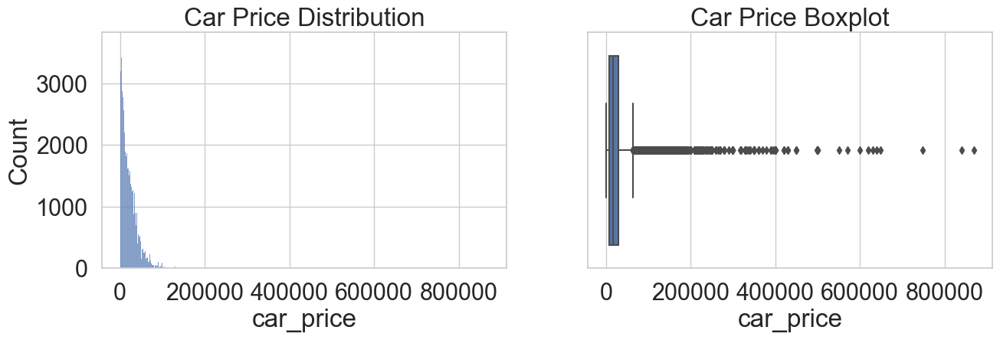

In [560]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=data, x='car_price', ax=axes[0]);
histplot.set_title('Car Price Distribution');
boxplot = sns.boxplot(data=data, x='car_price', ax=axes[1]);
boxplot.set_title('Car Price Boxplot');

We can notice a number of values detected after 200000 balance boarder. I'll have a closer look to cars that are above this limit.

In [561]:
data[data['car_price'] >= 200000]

,engine_vol,car_make,model,make_model,awd,category,doors,hp,power,capacity,year,mileage,fuel_type,gearbox_type,town,car_seller,car_price
82626,2.9,Mercedes-Benz,GLS,Mercedes-Benz GLS,1,NaN,NaN,NaN,NaN,NaN,2022,2000.0,Diesel,Automaatti,Seinäjoki,ferrain oy,208000
82627,2.9,Mercedes-Benz,GLS,Mercedes-Benz GLS,0,NaN,NaN,NaN,NaN,NaN,2023,5000.0,Bensiini,Automaatti,Lohja,carvista,208900
82630,2.0,Mercedes-Benz,SL,Mercedes-Benz SL,0,Coupe,NaN,NaN,NaN,NaN,2023,10000.0,Bensiini,Automaatti,Vantaa,veho,209600
82631,3.0,Porsche,911,Porsche 911,0,NaN,NaN,NaN,NaN,NaN,2020,12500.0,Bensiini,Automaatti,Lempäälä,kesman,209800
82632,-1.0,BMW,i7,BMW i7,1,NaN,NaN,NaN,NaN,NaN,2023,50.0,Sähkö,Automaatti,Helsinki,scc - sports car center,209800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82742,4.0,Ferrari,SF90 Stradale,Ferrari SF90 Stradale,0,NaN,NaN,NaN,NaN,NaN,2022,6000.0,Hybridi (bensiini/sähkö),Automaatti,Lempäälä,luxury collection automobiles,639900
82743,6.7,Rolls-Royce,Cullinan,Rolls-Royce Cullinan,0,NaN,NaN,NaN,420.0,NaN,2022,15000.0,Bensiini,Automaatti,Valkeakoski,koskiauto oy,649000
82744,4.0,Ferrari,SF90 Stradale,Ferrari SF90 Stradale,0,NaN,NaN,NaN,NaN,NaN,2021,7000.0,Hybridi (bensiini/sähkö),Automaatti,Vaasa,prestige car center oy,749000
82745,4.0,Ferrari,SF90 Stradale,Ferrari SF90 Stradale,0,NaN,NaN,NaN,NaN,NaN,2022,1500.0,Hybridi (bensiini/sähkö),Automaatti,Lempäälä,luxury collection automobiles,839900


There is 101 car which I can't mark as outlier as these cars are real and the price looks correct. Almost all of them are sport cars or luxury SUVs. 

Before applying methods for outliers detection we need to understand whether our data is normally distributed. There are several ways how to check it. Firstly, by simply looking at this histogram, we can tell the dataset does not exhibit a “bell-shape” and is not normally distributed. There is one more visual approach - a Q-Q plot.

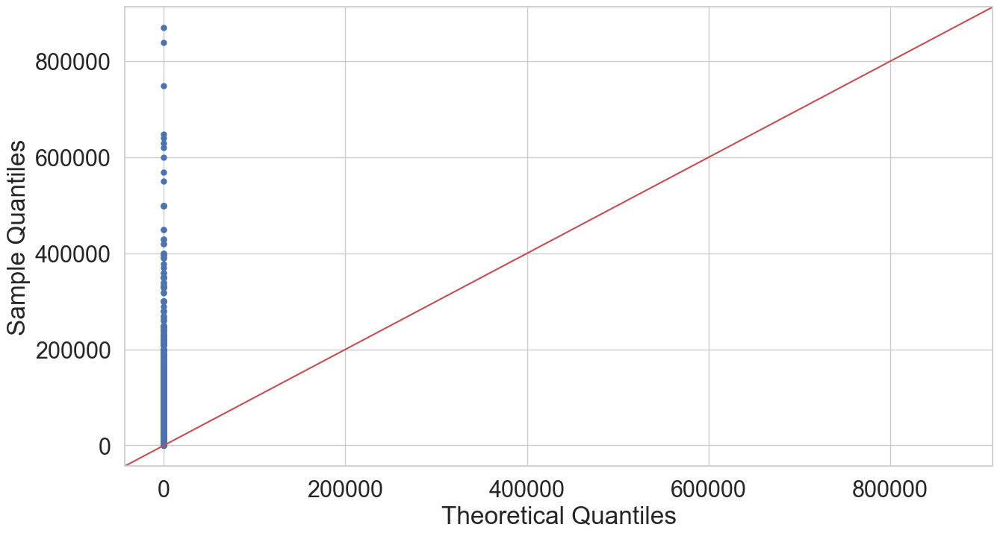

In [562]:
#create Q-Q plot with 45-degree line added to plot
fig = sm.qqplot(data['car_price'], line='45')
plt.show()

If the points on the plot fall roughly along a straight diagonal line, then we typically assume a dataset is normally distributed.
However, the points on this plot clearly don’t fall along the red line, so we would not assume that this dataset is normally distributed again.


In order to be sure I'll refer to non-visual tests. For example normaltest from Scipy library. This function tests the null hypothesis that a sample comes from a normal distribution. It is based on D’Agostino and Pearson’s test that combines skew and kurtosis to produce an omnibus test of normality.

In [563]:
stat, p = normaltest(data['car_price'])
print('stat=%.3f, p=%3f\n' % (stat, p))
if p > 0.05: #significance level is 0.05
    print('Probably Gaussian')
else: 
    print('Probably not Gaussian')

stat=95189.217, p=0.000000

Probably not Gaussian


Again, as expected, car price in the dataset is not distributed normally. However, we can make it distributed more 'normally'. For example, we can apply logarithm, square root or cube root to car price values.

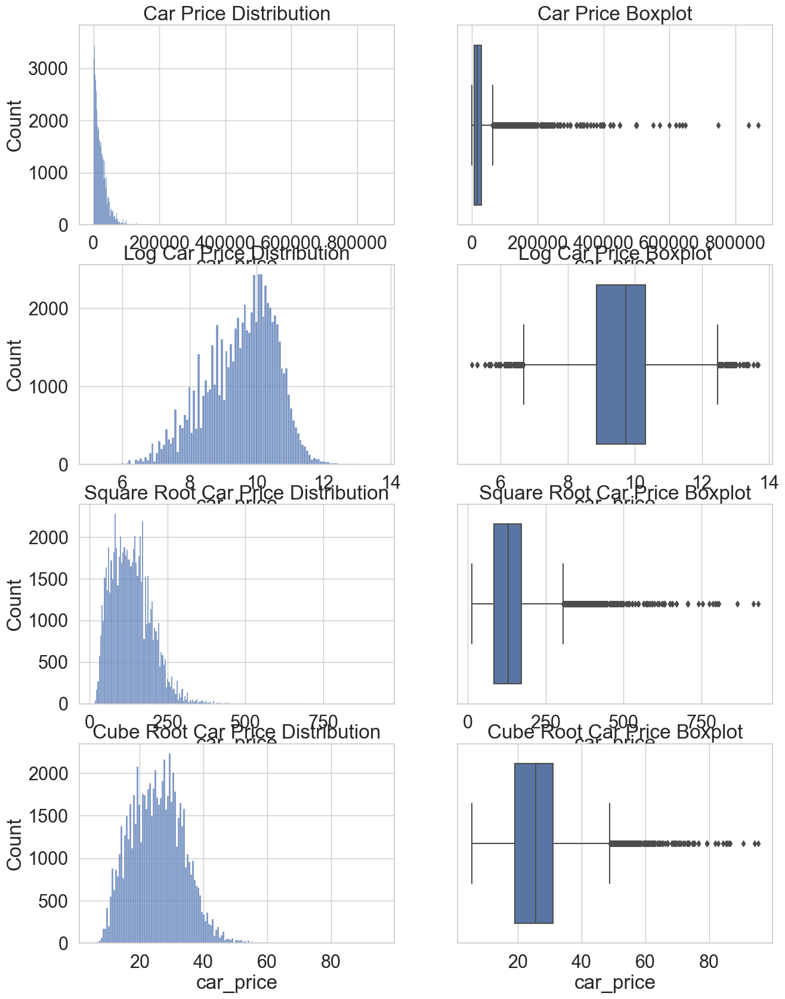

In [564]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
histplot = sns.histplot(data=data, x='car_price', ax=axes[0][0]);
histplot.set_title('Car Price Distribution');
boxplot = sns.boxplot(data=data, x='car_price', ax=axes[0][1]);
boxplot.set_title('Car Price Boxplot');
histplot_log = sns.histplot(data=data, x=np.log(data['car_price']), ax=axes[1][0]);
histplot_log.set_title('Log Car Price Distribution');
boxplot_log = sns.boxplot(data=data, x=np.log(data['car_price']), ax=axes[1][1]);
boxplot_log.set_title('Log Car Price Boxplot');
histplot_sq = sns.histplot(data=data, x=np.sqrt(data['car_price']), ax=axes[2][0]);
histplot_sq.set_title('Square Root Car Price Distribution');
boxplot_sq = sns.boxplot(data=data, x=np.sqrt(data['car_price']), ax=axes[2][1]);
boxplot_sq.set_title('Square Root Car Price Boxplot');
histplot_cb = sns.histplot(data=data, x=np.cbrt(data['car_price']), ax=axes[3][0]);
histplot_cb.set_title('Cube Root Car Price Distribution');
boxplot_cb = sns.boxplot(data=data, x=np.cbrt(data['car_price']), ax=axes[3][1]);
boxplot_cb.set_title('Cube Root Car Price Boxplot');

The 'bell curve' is more clear for log distribution, however, major part of outliers should be on the right side, so I'll choose cube root distribution to proceed with.

## Outliers detection

Now we can process outliers in 'car_price' feature. I'll use Inter quartile range method and Three-sigma method. 

### Interquartile range method

#### Method algorythm:

1. Calculate the 25th and 75th quantiles (1st and 3rd quartiles) - $Q_{25}$ and $Q_{75}$ for the reviewed feature.
2. Calculate interquartile distance: 
    * $IQR=Q_{75}-Q_{25}$
3. Determine the upper and lower Tukey bounds:

    * $bound_{upper} = Q_{75} + 1.5*IQR$
    
    * $bound_{lower} = Q_{25} - 1.5*IQR$
4. Find observations that are out of bounds

### Three-sigma method (Z-score)

Three-sigma method rule states that if the data distribution is normal, then 99.73% lie in the interval: $(\mu-3 \sigma$ , $\mu+3 \sigma)$, 
where  
* $\mu$ - mathematical expectation (in our case it is  mean value).
* $\sigma$ - standard deviation. 

Observations that lie outside this interval will be considered outliers.

#### **Method algorythm:**

1. Calculate mean and standard deviation of $\mu$ и $\sigma$ for the examined feature.
2. Define upper and lower bounds:
    * $bound_{upper} = \mu - 3 * \sigma$
    
    * $bound_{lower} = \mu + 3 * \sigma$
3. Find observations that are out of bounds.

I'll start with Interquartile range method.

In [565]:
def find_outliers_iqr(data, feature, left=1.5, right=1.5, sq_scale=False, cube_scale=False):
    """
    Finds outliers in data using the interquartile range method.
    The classic method is modified by adding:
    * Possibility of square and cube root distribution
    * manual control of the number of interquartile ranges in both directions of the distribution
    Args:
        data(pandas.DataFrame): dataset
        feature (str): name of the feature based on which outliers are searched
        left (float, optional): number of interquartile ranges to the left of the distribution. The default is 1.5.
        right (float, optional): number of interquartile ranges to the right side of the distribution. The default is 1.5.
        sq_scale (bool, optional): square root mode. Default is False - no square root is applied.
        cube_scale (bool, optional): cube root mode. Default is False - no cube root is applied.

    returns:
        pandas.DataFrame: outlier observations
        pandas.DataFrame: cleaned up data with outliers removed
    """
    if sq_scale:
        x = np.sqrt(data[feature])
    elif cube_scale:
        x = np.cbrt(data[feature])
    else:
        x= data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x<lower_bound) | (x > upper_bound)]
    cleaned = data[(x>=lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = find_outliers_iqr(data, 'car_price', cube_scale=True)

print(f'Number of outliers: {outliers.shape[0]}')
print(f'Remaining data (cleaned): {cleaned.shape[0]}')

Number of outliers: 487
Remaining data (cleaned): 74537


Now we can check how our cleaned data looks like.

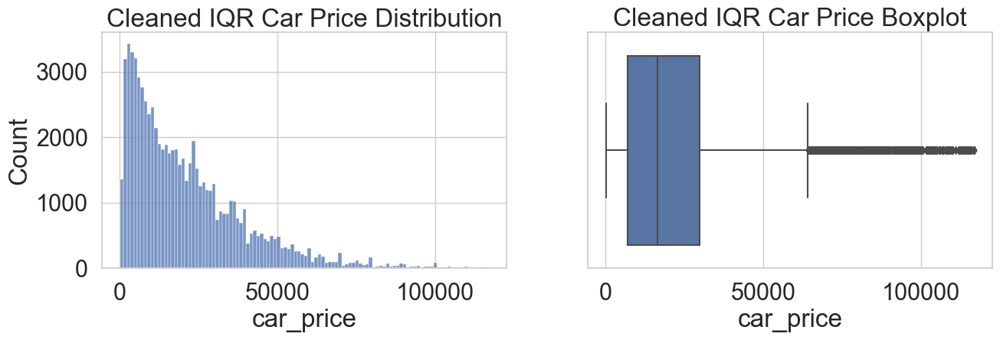

In [566]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=cleaned, x='car_price', ax=axes[0]);
histplot.set_title('Cleaned IQR Car Price Distribution');
boxplot = sns.boxplot(data=cleaned, x='car_price', ax=axes[1]);
boxplot.set_title('Cleaned IQR Car Price Boxplot');

Now I'll apply Three sigma method:

In [567]:
def find_outliers_z_score(data, feature, left=3, right=3, sq_scale=False, cube_scale=False):
    """
    Finds outliers in data using the z-score method.
    The classic method is modified by adding:
    * Possibility of square and cube root distribution
    * manual control of the number of standard deviations in both sides of the distribution
    Args:
        data(pandas.DataFrame): dataset
        feature (str): name of the feature based on which outliers are searched
        left (float, optional): number of standard deviations to the left of the distribution. The default is 1.5.
        right (float, optional): number of standard to the right side of the distribution. The default is 1.5.
        sq_scale (bool, optional): square root mode. Default is False - no square root is applied.
        cube_scale (bool, optional): cube scale mode. Default is False - no logarithm is applied.

    returns:
        pandas.DataFrame: outlier observations
        pandas.DataFrame: cleaned up data with outliers removed
    """
    if sq_scale:
        x = np.sqrt(data[feature])
    elif cube_scale:
        x = np.cbrt(data[feature])
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

outliers_z, cleaned_z = find_outliers_z_score(data, 'car_price', cube_scale=True)

print(f'Number of outliers: {outliers_z.shape[0]}')
print(f'Remaining data (cleaned): {cleaned_z.shape[0]}')

Number of outliers: 375
Remaining data (cleaned): 74649


Visualizing result as well.

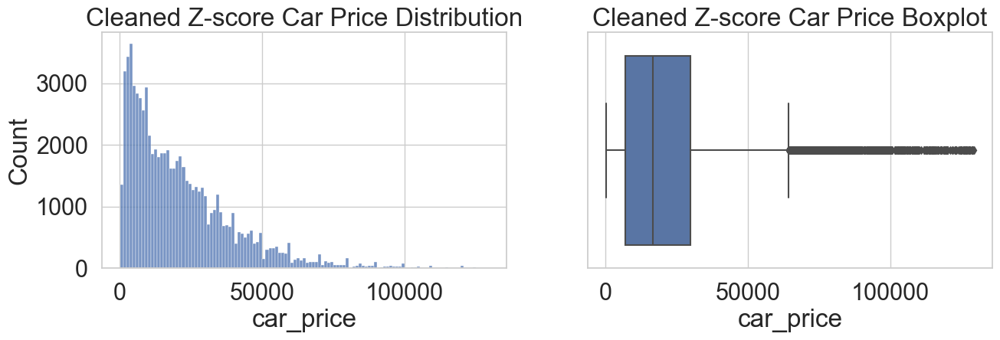

In [568]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=cleaned_z, x='car_price', ax=axes[0]);
histplot.set_title('Cleaned Z-score Car Price Distribution');
boxplot = sns.boxplot(data=cleaned_z, x='car_price', ax=axes[1]);
boxplot.set_title('Cleaned Z-score Car Price Boxplot');

Additionally we can visualise how both methods worked. We can write a comprehensive function for that:

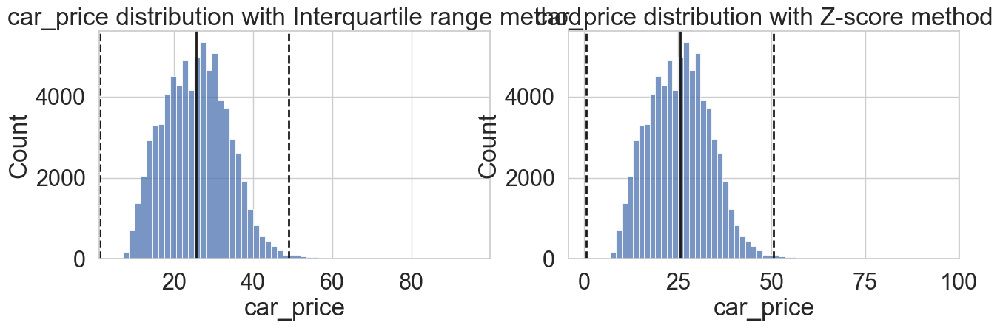

In [569]:
def outliers_iqr_z_visualize(df, feature, iqr_left=1.5, iqr_right=1.5, z_left=3, z_right=3, sq_scale=False, cube_scale=False):
    """
    Returns 2 histplots with indication of outliers using the interquartile range and z-score method.
    The classic method is modified by adding:
    * Possibility of square and cube root distribution
    * manual control of distribution borders
    Args:
        data(pandas.DataFrame): dataset
        feature (str): name of the feature based on which outliers are searched
        iqr_left (float, optional): number of interquartile ranges to the left of the distribution. The default is 1.5.
        iqr_right (float, optional): number of interquartile ranges to the right of the distribution. The default is 1.5.
        z_left (float, optional): number of standard deviations to the left of the distribution. The default is 3.
        z_right (float, optional): number of standard deviations to the right of the distribution. The default is 3.
        sq_scale (bool, optional): square root mode. Default is False - no square root is applied.       
        cube_scale (bool, optional): cube root mode. Default is False - no cube root is applied.

    returns:
        seaborn.histplot: outlier visualization for IQR method
        seaborn.histplot: outlier visualization for Z-score method
    """
    if sq_scale:
        key_feature = np.sqrt(df[feature])
    elif cube_scale:
        key_feature = np.cbrt(df[feature])
    else:
        key_feature = df[feature]
    
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
    histplot_iqr = sns.histplot(key_feature, bins=60, ax=ax[0]);
    histplot_iqr.axvline(key_feature.quantile(0.50), color='k', lw=2)
    histplot_iqr.axvline(
        (key_feature.quantile(0.25) - ((key_feature.quantile(0.75)-key_feature.quantile(0.25)) * iqr_left)), 
        color='k', 
        ls='--', 
        lw=2)
    histplot_iqr.axvline(
        (key_feature.quantile(0.75) + ((key_feature.quantile(0.75)-key_feature.quantile(0.25)) * iqr_right)), 
        color='k', 
        ls='--', 
        lw=2)
    histplot_iqr.set_title(f'{feature} distribution with Interquartile range method');

    histplot_z = sns.histplot(key_feature, bins=60, ax=ax[1])
    histplot_z.axvline(key_feature.mean(), color='k', lw=2)
    histplot_z.axvline(key_feature.mean() + z_right *key_feature.std(), color='k', ls='--', lw=2)
    histplot_z.axvline(key_feature.mean() - z_left *key_feature.std(), color='k', ls='--', lw=2)
    histplot_z.set_title(f'{feature} distribution with Z-score method');
    return histplot_iqr, histplot_z;
    

outliers_iqr_z_visualize(data, 'car_price', cube_scale=True);

Both methods worked fine. I'll proceed with Z-score method as it is less strict.

In [570]:
data_cleaned = cleaned_z

Column 'mileage' also requires check for outliers.

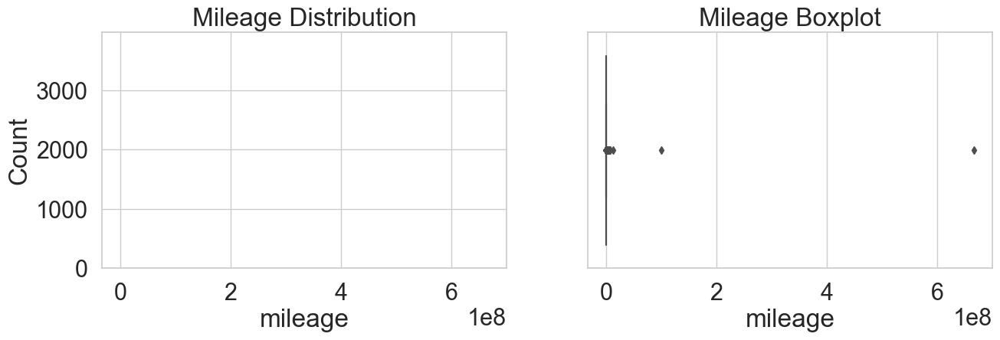

In [571]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=data_cleaned, x='mileage', ax=axes[0]);
histplot.set_title('Mileage Distribution');
boxplot = sns.boxplot(data=data_cleaned, x='mileage', ax=axes[1]);
boxplot.set_title('Mileage Boxplot');


There are some obvious outliers. Let's look at the cars that have more than 1 million kilometers on odometer.

In [572]:
data_cleaned[data_cleaned['mileage'] >= 1000000]

,engine_vol,car_make,model,make_model,awd,category,doors,hp,power,capacity,year,mileage,fuel_type,gearbox_type,town,car_seller,car_price
595,2.0,Toyota,Avensis,Toyota Avensis,0,Universal,NaN,NaN,NaN,NaN,2005,4500000.0,Diesel,Manuaali,Karvia,tom peltokangas,600
1004,1.0,Kia,Picanto,Kia Picanto,0,NaN,4/5,NaN,NaN,NaN,2006,2690854.0,Bensiini,Manuaali,Espoo,raeed nayyef,800
1408,1.7,Opel,Astra,Opel Astra,0,NaN,4/5,NaN,NaN,NaN,1999,3021490.0,Diesel,Manuaali,Espoo,automyynti laurika oy,999
1552,1.9,Skoda,Roomster,Skoda Roomster,0,NaN,NaN,NaN,NaN,NaN,2007,4000000.0,Diesel,Manuaali,Tampere,seppo lindeman,1000
1763,2.0,Mazda,6,Mazda 6,0,NaN,NaN,NaN,NaN,NaN,2009,2692900.0,Diesel,Manuaali,Helsinki,all motors oy,1100
1775,2.0,Audi,A6,Audi A6,0,NaN,NaN,NaN,NaN,NaN,2001,3000000.0,Bensiini,Manuaali,Oulu,ville miettunen,1100
2492,1.9,Volvo,V40,Volvo V40,0,Universal,NaN,NaN,NaN,NaN,2003,2611322.0,Bensiini,Automaatti,Laitila,kyösti heinonen,1350
2530,1.4,Citroen,C3,Citroen C3,0,NaN,4/5,NaN,NaN,NaN,2007,1994100.0,Bensiini,Manuaali,Porvoo,jouni kalevi paassilta,1350
2948,2.0,Audi,A4,Audi A4,0,Universal,4/5,NaN,NaN,NaN,2005,5555555.0,Bensiini,Manuaali,Parkano,petri juhana männistö,1500
3820,2.4,Volvo,S60,Volvo S60,0,NaN,NaN,NaN,NaN,NaN,2002,4917910.0,Diesel,Automaatti,Suomussalmi,ämmän auto,1700


Some values like 6666666666 or 12345678 are usually indicated in case if owner don't know or don't want to report car mileage. Other values above 1 million kilometers probably have extra digit entered by mistake. Anyway we are not interested in cars above 1 million km so we just delete them.

In [573]:
data_cleaned = data_cleaned[data_cleaned['mileage'] < 1000000]

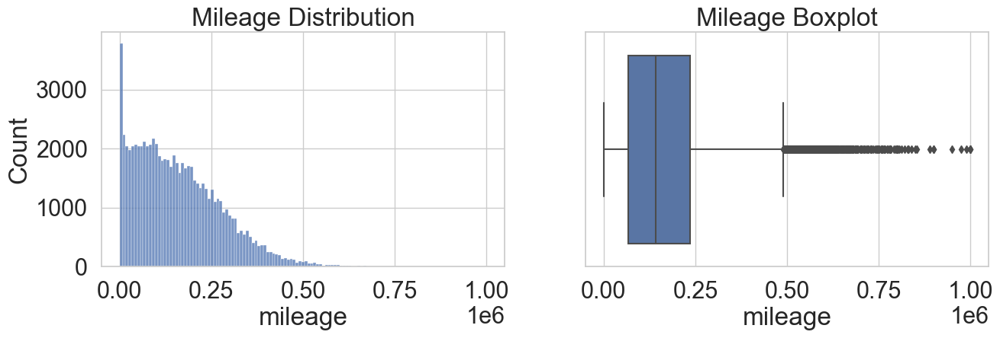

In [574]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=data_cleaned, x='mileage', ax=axes[0]);
histplot.set_title('Mileage Distribution');
boxplot = sns.boxplot(data=data_cleaned, x='mileage', ax=axes[1]);
boxplot.set_title('Mileage Boxplot');

Again, distribution of mileage does not look as Gaussian. Let's do double check using scipy.normaltest again:

In [575]:
stat, p = normaltest(data_cleaned['mileage'])
print('stat=%.3f, p=%3f\n' % (stat, p))
if p > 0.05: #significance level is 0.05
    print('Probably Gaussian')
else: 
    print('Probably not Gaussian')

stat=9281.829, p=0.000000

Probably not Gaussian


Let's see if any method helps to distribute data normally.

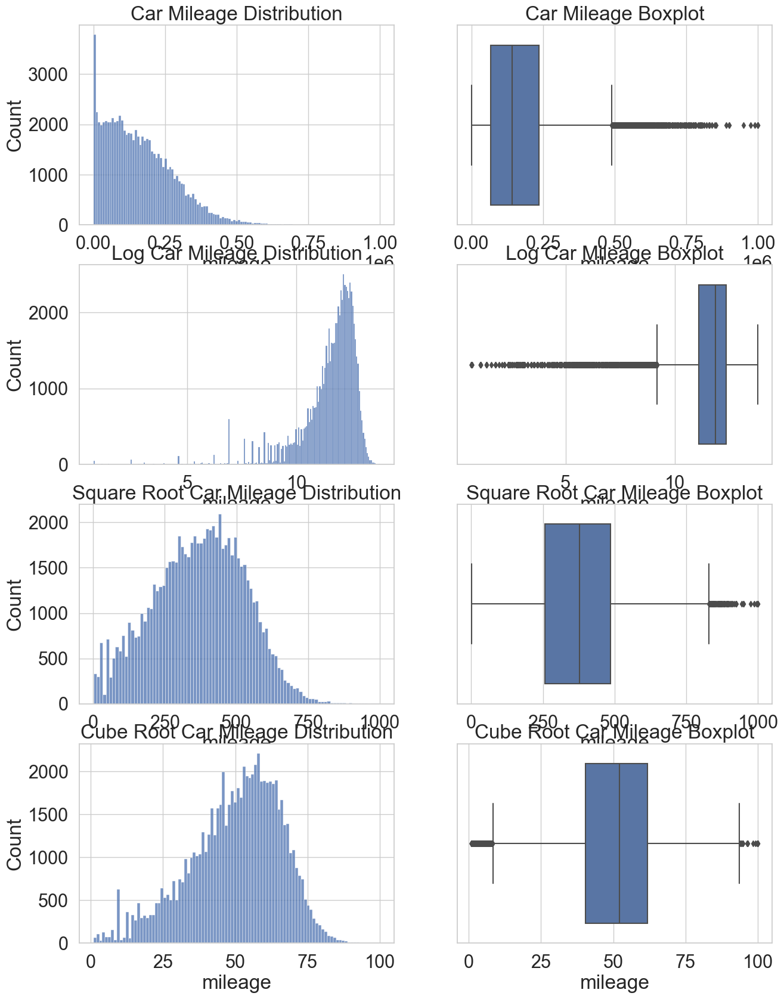

In [576]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
histplot = sns.histplot(data=data_cleaned, x='mileage', ax=axes[0][0]);
histplot.set_title('Car Mileage Distribution');
boxplot = sns.boxplot(data=data_cleaned, x='mileage', ax=axes[0][1]);
boxplot.set_title('Car Mileage Boxplot');
histplot_log = sns.histplot(data=data_cleaned, x=np.log(data_cleaned['mileage']+1), ax=axes[1][0]);
histplot_log.set_title('Log Car Mileage Distribution');
boxplot_log = sns.boxplot(data=data_cleaned, x=np.log(data_cleaned['mileage']+1), ax=axes[1][1]);
boxplot_log.set_title('Log Car Mileage Boxplot');
histplot_sq = sns.histplot(data=data_cleaned, x=np.sqrt(data_cleaned['mileage']), ax=axes[2][0]);
histplot_sq.set_title('Square Root Car Mileage Distribution');
boxplot_sq = sns.boxplot(data=data_cleaned, x=np.sqrt(data_cleaned['mileage']), ax=axes[2][1]);
boxplot_sq.set_title('Square Root Car Mileage Boxplot');
histplot_cb = sns.histplot(data=data_cleaned, x=np.cbrt(data_cleaned['mileage']), ax=axes[3][0]);
histplot_cb.set_title('Cube Root Car Mileage Distribution');
boxplot_cb = sns.boxplot(data=data_cleaned, x=np.cbrt(data_cleaned['mileage']), ax=axes[3][1]);
boxplot_cb.set_title('Cube Root Car Mileage Boxplot');

I think square root data is closest to Gaussian. Now we can visualize outliers.

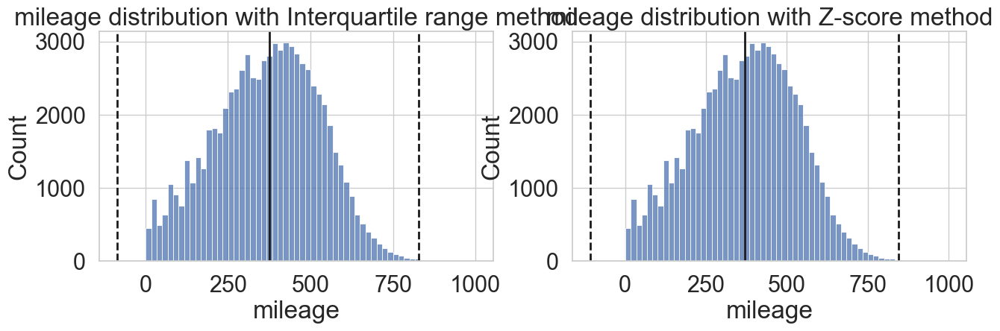

In [577]:
outliers_iqr_z_visualize(data_cleaned, 'mileage', sq_scale=True);

I'll select interquartile range method for outliers in 'mileage' feature.

In [578]:
outliers, cleaned = find_outliers_iqr(data_cleaned, 'mileage', sq_scale=True)

print(f'Number of outliers: {outliers.shape[0]}')
print(f'Remaining data (cleaned): {cleaned.shape[0]}')

Number of outliers: 75
Remaining data (cleaned): 74531


In [579]:
data_cleaned = cleaned

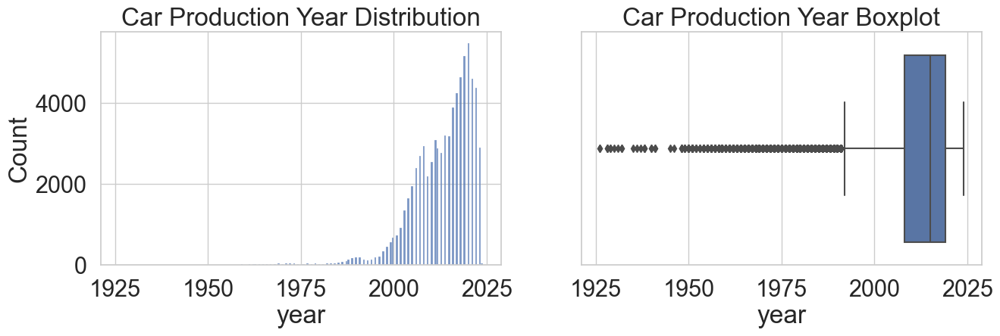

In [580]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=data_cleaned, x='year', ax=axes[0]);
histplot.set_title('Car Production Year Distribution');
boxplot = sns.boxplot(data=data_cleaned, x='year', ax=axes[1]);
boxplot.set_title('Car Production Year Boxplot');

In [581]:
data_cleaned[data_cleaned['year'] < 1985]

,engine_vol,car_make,model,make_model,awd,category,doors,hp,power,capacity,year,mileage,fuel_type,gearbox_type,town,car_seller,car_price
1286,1.3,Lada,2105,Lada 2105,0,Sedan,4/5,NaN,NaN,NaN,1983,64000.0,Bensiini,Manuaali,Inari,marko teuvo johannes tiainen,950
1575,1.5,Datsun,- Sunny,Datsun - Sunny,0,NaN,NaN,NaN,NaN,NaN,1984,150000.0,Bensiini,Manuaali,Turku,saku lemi,1000
1791,0.8,Suzuki,Alto,Suzuki Alto,0,NaN,NaN,NaN,NaN,NaN,1983,100000.0,Bensiini,Manuaali,Kajaani,eetu moilanen,1100
1937,1.6,Nissan,Cherry,Nissan Cherry,0,NaN,NaN,NaN,NaN,NaN,1982,161000.0,Bensiini,Manuaali,Pudasjärvi,janne partala,1200
2967,1.5,Saab,96,Saab 96,0,Sedan,2/3,NaN,NaN,NaN,1978,33052.0,Bensiini,Manuaali,Oulu,jorma tirkkonen,1500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81023,8.1,Chevrolet,Chevelle,Chevrolet Chevelle,0,NaN,NaN,NaN,NaN,NaN,1970,17600.0,Bensiini,Automaatti,Siilinjärvi,tero hemming,83500
81440,5.9,Dodge,Lil Red Truck,Dodge Lil Red Truck,0,NaN,NaN,NaN,NaN,NaN,1979,8900.0,Bensiini,Automaatti,Helsinki,tero ilola,90000
81744,2.2,Porsche,911,Porsche 911,0,Coupe,NaN,NaN,NaN,NaN,1970,123.0,Bensiini,Manuaali,Turku,ove´s garage,99800
81782,6.4,Cadillac,Eldorado,Cadillac Eldorado,0,NaN,NaN,NaN,NaN,NaN,1959,89432.0,Bensiini,Automaatti,Riihimäki,sami kuutti,99900


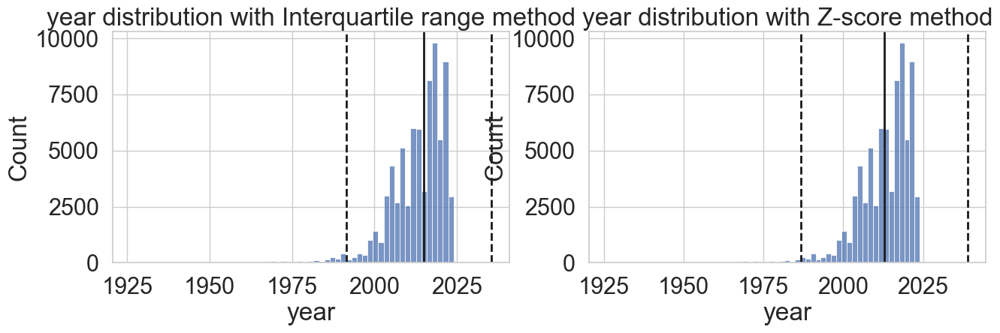

In [582]:
outliers_iqr_z_visualize(data_cleaned, 'year');

In [583]:
outliers_z, cleaned_z = find_outliers_z_score(data_cleaned, 'year')

print(f'Number of outliers: {outliers_z.shape[0]}')
print(f'Remaining data (cleaned): {cleaned_z.shape[0]}')

Number of outliers: 1098
Remaining data (cleaned): 73433


In [584]:
data_cleaned = cleaned_z

Finally, dropping duplicates

In [585]:
data_cleaned = data_cleaned.drop_duplicates()
data_cleaned.shape

(72953, 17)

In [586]:
data_cleaned = data_cleaned.reset_index(drop=True)

In [587]:
data_cleaned.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_clean.csv')

In [588]:
data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_clean.csv', index_col=0)
data['make_model'] = data['make_model'].apply(lambda x: x.lower())

In [589]:
cars = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/characteristics.csv', index_col=0)
cars

,manufacturer,model,category,mileage,year,gear_box_type,doors,wheel,color,interior_color,vin,leather_interior,deal_type,price,customs
ID,,,,,,,,,,,,,,,
0,NISSAN,Juke,Jeep,111111111,2010,Tiptronic,4/5,Left wheel,Carnelian red,Black,JN8AF5MV2BT011450,1,For Sale,7300,0
1,HYUNDAI,Santa FE,Jeep,88000,2013,Tiptronic,4/5,Left wheel,Grey,Black,NaN,1,For Sale,13600,0
2,CHEVROLET,Cruze,Sedan,140000,2013,Tiptronic,4/5,Left wheel,Silver,Black,NaN,1,For Sale,Price negotiable,640
3,TOYOTA,Prius,Sedan,71000,2013,Automatic,4/5,Left wheel,Grey,Black,NaN,1,For Sale,6100,0
4,SUZUKI,Grand Vitara,Jeep,155000,2008,Automatic,4/5,Left wheel,Grey,Black,JS3TD54V284130629,0,For Sale,6377,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80120,ALFA ROMEO,Giulia Veloce,Sedan,0,2019,Automatic,4/5,Left wheel,Red,Black,NaN,1,For Sale,Price negotiable,0
80121,FIAT,500,Hatchback,0,2019,Automatic,2/3,Left wheel,White,Grey,NaN,0,For Sale,Price negotiable,0
80122,FIAT,Tipo,Sedan,0,2019,Manual,4/5,Left wheel,White,Grey,NaN,0,For Sale,Price negotiable,0


In [590]:
cars = cars[['manufacturer', 'model', 'category', 'year', 'gear_box_type', 'doors']]
cars['make_model'] = cars['manufacturer'] + ' ' + cars['model']
cars['make_model'] = cars['make_model'].astype(str).apply(lambda x: x.lower())
cars['gear_box_type'] = cars['gear_box_type'].apply(
    lambda x: {'Automatic': 'Automaatti', 'Tiptronic': 'Automaatti', 'Manual': 'Manuaali', 'Variator': 'Automaatti'}.get(x)
)
cars = cars.drop(columns=['manufacturer', 'model'])
cars = cars.dropna()
cars

/var/folders/fg/7cyb3m_113j_1hkfwhtbsy8h0000gn/T/ipykernel_4414/3988033763.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cars['make_model'] = cars['manufacturer'] + ' ' + cars['model']
/var/folders/fg/7cyb3m_113j_1hkfwhtbsy8h0000gn/T/ipykernel_4414/3988033763.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cars['make_model'] = cars['make_model'].astype(str).apply(lambda x: x.lower())
/var/folders/fg/7cyb3m_113j_1hkfwhtbsy8h0000gn/T/ipykernel_4414/3988033763.py:4: SettingWithCopyWarning: 
A value i

,category,year,gear_box_type,doors,make_model
ID,,,,,
0,Jeep,2010,Automaatti,4/5,nissan juke
1,Jeep,2013,Automaatti,4/5,hyundai santa fe
2,Sedan,2013,Automaatti,4/5,chevrolet cruze
3,Sedan,2013,Automaatti,4/5,toyota prius
4,Jeep,2008,Automaatti,4/5,suzuki grand vitara
...,...,...,...,...,...
80120,Sedan,2019,Automaatti,4/5,alfa romeo giulia veloce
80121,Hatchback,2019,Automaatti,2/3,fiat 500
80122,Sedan,2019,Manuaali,4/5,fiat tipo


In [591]:
cars.groupby(by=['make_model', 'gear_box_type'])[['doors', 'category']].agg(pd.Series.mode)

,,doors,category
make_model,gear_box_type,,
acura ilx,Automaatti,4/5,Sedan
acura ilx hybrid,Automaatti,4/5,Sedan
acura mdx,Automaatti,4/5,Jeep
acura rdx,Automaatti,4/5,Jeep
acura rdx techno,Automaatti,4/5,Jeep
...,...,...,...
სხვა iamaha,Automaatti,2/3,Coupe
სხვა iveco dayly,Manuaali,4/5,Microbus
სხვა kamaz/ კამაზი,Manuaali,2/3,Sedan


In [592]:
cars_hp = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/autoscout24-germany-dataset.csv')
cars_hp['make_model'] = cars_hp['make'] + ' ' + cars_hp['model']
cars_hp['make_model'] = cars_hp['make_model'].astype(str).apply(lambda x: x.lower())
cars_hp = cars_hp.drop(columns=['make', 'model', 'mileage', 'offerType', 'price'])

fuel_dict = {
    'Gasoline': 'Bensiini',
    'Electric/Gasoline': 'Hybridi (bensiini/sähkö)',
    'Electric': 'Sähkö',
    'LPG': 'Kaasu',
    'CNG': 'Kaasu',
    'Electric/Diesel': 'Hybridi (diesel/sähkö)',
    'Others': np.nan,
    '-/- (Fuel)': np.nan,
    'Ethanol': 'E85/bensiini',
    'Hydrogen': np.nan
}

cars_hp['fuel'] = cars_hp['fuel'].apply(lambda x: fuel_dict.get(x, x))

gear_dict = {
    'Manual': 'Manuaali',
    'Automatic': 'Automaatti',
    'Semi-automatic': np.nan
}

cars_hp['gear'] = cars_hp['gear'].apply(lambda x: gear_dict.get(x, x))
cars_hp = cars_hp.dropna()
cars_hp

,fuel,gear,hp,year,make_model
0,Diesel,Manuaali,116.0,2011,bmw 316
1,Bensiini,Manuaali,122.0,2011,volkswagen golf
2,Bensiini,Manuaali,160.0,2011,seat exeo
3,Bensiini,Manuaali,110.0,2011,renault megane
4,Bensiini,Manuaali,156.0,2011,peugeot 308
...,...,...,...,...,...
46400,Hybridi (bensiini/sähkö),Manuaali,71.0,2021,fiat 500
46401,Hybridi (bensiini/sähkö),Manuaali,71.0,2021,fiat 500
46402,Hybridi (bensiini/sähkö),Manuaali,71.0,2021,fiat 500
46403,Hybridi (bensiini/sähkö),Manuaali,71.0,2021,fiat 500


In [593]:
cars_hp_grouped_year = cars_hp.groupby(by=['make_model', 'year', 'gear', 'fuel'], as_index=False)['hp'].agg(pd.Series.mode)
cars_hp_grouped = cars_hp.groupby(by=['make_model', 'gear', 'fuel'], as_index=False)['hp'].agg(pd.Series.mode)

In [594]:
data_grouped_year = data.groupby(by=['make_model', 'car_make', 'year', 'gearbox_type', 'fuel_type'], as_index=False)['engine_vol'].count()
data_grouped = data.groupby(by=['make_model', 'gearbox_type', 'fuel_type'], as_index=False)['engine_vol'].count()

In [595]:
data_joined_year = pd.merge(
    data_grouped_year,
    cars_hp_grouped_year, 
    how='left', 
    left_on=['make_model', 'year', 'fuel_type', 'gearbox_type'],
    right_on=['make_model', 'year', 'fuel', 'gear']
)

In [596]:
data_joined = pd.merge(
    data_joined_year,
    cars_hp_grouped, 
    how='left', 
    left_on=['make_model', 'fuel_type', 'gearbox_type'],
    right_on=['make_model', 'fuel', 'gear']
)

In [597]:
data_joined['hp'] = np.where(data_joined['hp_x'].notna(), data_joined['hp_x'], data_joined['hp_y'])
data_joined['hp'] = data_joined['hp'].apply(lambda x: x if isinstance(x, float) else mean(x))
data_joined = data_joined.drop(columns=['engine_vol', 'gear_x', 'gear_y', 'fuel_x', 'fuel_y', 'hp_x', 'hp_y'])

data_joined_make = data_joined.groupby(by='car_make')['hp'].mean()

data_joined = pd.merge(
    data_joined,
    data_joined_make, 
    how='left', 
    on='car_make'
)

data_joined['hp'] = np.where(data_joined['hp_x'].notna(), data_joined['hp_x'], data_joined['hp_y'])
data_joined = data_joined.drop(columns=['car_make', 'hp_x', 'hp_y'])

In [598]:
data = pd.merge(
    data,
    data_joined, 
    how='left', 
    on=['make_model', 'year', 'gearbox_type', 'fuel_type']
)
data['hp_x'] = np.where(data['hp_x'].notna(), data['hp_x'], data['power']/0.73549875)
data['hp_x'] = np.where(data['hp_x'] > 59, data['hp_x'], data['hp_y'])
data = data.drop(columns=['hp_y', 'power'])
data = data.rename(columns={'hp_x': 'hp'})

In [599]:
hp_grouped = data.groupby(by=['engine_vol', 'year', 'fuel_type', 'gearbox_type'], as_index=False)['hp'].mean()
hp_grouped['hp'] = hp_grouped['hp'].apply(lambda x: x if isinstance(x, float) else np.nan if len(x)==0 else mean(x))

data = pd.merge(
    data,
    hp_grouped, 
    how='left', 
    on=['engine_vol', 'year', 'fuel_type', 'gearbox_type']
)
data['hp_x'] = np.where(data['hp_x'].notna(), data['hp_x'], data['hp_y'])
data = data.drop(columns=['hp_y'])
data = data.rename(columns={'hp_x': 'hp'})

In [600]:
hp_grouped_no_year = data.groupby(by=['engine_vol', 'fuel_type'], as_index=False)['hp'].mean()

data = pd.merge(
    data,
    hp_grouped_no_year, 
    how='left', 
    on=['engine_vol', 'fuel_type']
)
data['hp_x'] = np.where(data['hp_x'].notna(), data['hp_x'], data['hp_y'])
data = data.drop(columns=['hp_y'])
data = data.rename(columns={'hp_x': 'hp'})

In [601]:
data['hp'] = data['hp'].fillna(data['hp'].mean())

In [602]:
cars_categories = cars.groupby(by=['make_model'], as_index=False)[['doors', 'category']].agg(pd.Series.mode)

cars_categories['doors'] = cars_categories['doors'].apply(
    lambda x: x.replace(' ', '') if isinstance(x, str) else x.tolist()[0].replace(' ', '')
)

cars_categories['category'] = cars_categories['category'].apply(lambda x: x if isinstance(x, str) else x.tolist()[0])

In [603]:
data = pd.merge(
    data,
    cars_categories, 
    how='left', 
    on='make_model'
)

data['category_x'] = np.where(data['category_x'].notna(), data['category_x'], data['category_y'])

data['doors_x'] = np.where(data['doors_x'].notna(), data['doors_x'], data['doors_y'])

data = data.drop(columns=['category_y', 'doors_y'])
data = data.rename(columns={'category_x': 'category', 'doors_x': 'doors'})

In [604]:
category_door = cars.groupby(by=['category'], as_index=False)['doors'].agg(pd.Series.mode)
category_door['doors'] = category_door['doors'].apply(
    lambda x: x.replace(' ', ''))

door_category = cars.groupby(by=['doors'], as_index=False)['category'].agg(pd.Series.mode)
door_category['doors'] = door_category['doors'].apply(
    lambda x: x.replace(' ', ''))

data = pd.merge(
    data,
    category_door, 
    how='left', 
    on='category'
)

data['doors_x'] = np.where(data['doors_x'].notna(), data['doors_x'], data['doors_y'])

data = data.drop(columns=['doors_y'])
data = data.rename(columns={'doors_x': 'doors'})

data = pd.merge(
    data,
    door_category, 
    how='left', 
    on='doors'
)

data['category_x'] = np.where(data['category_x'].notna(), data['category_x'], data['category_y'])

data = data.drop(columns=['category_y'])
data = data.rename(columns={'category_x': 'category'})

data = pd.merge(
    data,
    category_door, 
    how='left', 
    on='category'
)

data['doors_x'] = np.where(data['doors_x'].notna(), data['doors_x'], data['doors_y'])

data = data.drop(columns=['doors_y'])
data = data.rename(columns={'doors_x': 'doors'})

In [605]:
awd_category = data.groupby(by=['awd'], as_index=False)['category'].agg(pd.Series.mode)

data = pd.merge(
    data,
    awd_category, 
    how='left', 
    on='awd'
)

data['category_x'] = np.where(data['category_x'].notna(), data['category_x'], data['category_y'])

data = data.drop(columns=['category_y'])
data = data.rename(columns={'category_x': 'category'})
data['doors'] = data['doors'].fillna('4/5')

In [606]:
def get_hp_cat(hp_value):
    if hp_value < 100:
        return 'low (less 100)'
    elif hp_value < 170:
        return 'medium (less 170)'
    elif hp_value < 270:
        return 'high (less 270)'
    else:
        return 'max (more 270)'
    
data['hp_cat'] = data['hp'].apply(get_hp_cat)

non_electric = data[(data['fuel_type'] == 'Bensiini') | (data['fuel_type'] == 'Diesel') | (data['fuel_type'] == 'Kaasu') | (data['fuel_type'] == 'E85/bensiini')].index

electric = data[(data['fuel_type'] == 'Hybridi (bensiini/sähkö)') | (data['fuel_type'] == 'Sähkö') | (data['fuel_type'] == 'Hybridi (diesel/sähkö)')].index

data.loc[non_electric, 'capacity'] = 0

electric_capacity = data[
    (data['fuel_type'] == 'Hybridi (bensiini/sähkö)') 
    | (data['fuel_type'] == 'Sähkö') 
    | (data['fuel_type'] == 'Hybridi (diesel/sähkö)')
].groupby(by='hp_cat')['capacity'].median()

data = pd.merge(
    data,
    electric_capacity, 
    how='left', 
    on='hp_cat'
)

data['capacity_x'] = np.where(data['capacity_x'].notna(), data['capacity_x'], data['capacity_y'])

data = data.drop(columns=['capacity_y'])
data = data.rename(columns={'capacity_x': 'capacity'})

We can also create additional feature with avg price category for each car company.

In [607]:
data['car_price'] = data['car_price'].astype('int')
temp = data.copy()
table = data.groupby(['car_make'])['car_price'].mean()
temp = temp.merge(table.reset_index(), how='left',on='car_make')
bins = [0,10000,20000,40000,125000]
cars_bin=['Budget','Medium','Highend','Luxury']
data['price_category'] = pd.cut(temp['car_price_y'],bins,right=False,labels=cars_bin)
data.head()

,engine_vol,car_make,model,make_model,awd,category,doors,hp,capacity,year,mileage,fuel_type,gearbox_type,town,car_seller,car_price,hp_cat,price_category
0,2.0,Mercedes-Benz,GLC,mercedes-benz glc,1,Coupe,2/3,167.890533,50.0,2020,15000.0,Hybridi (bensiini/sähkö),Automaatti,Espoo,veho,57800,medium (less 170),Highend
1,2.2,Opel,Frontera,opel frontera,0,Jeep,4/5,128.565644,0.0,1999,398000.0,Diesel,Manuaali,Kuusamo,automyynti haapasalo,3795,medium (less 170),Medium
2,1.2,Fiat,Punto,fiat punto,0,Hatchback,4/5,69.000000,0.0,2001,248000.0,Bensiini,Manuaali,Rovaniemi,kalle sarkioja,170,low (less 100),Budget
3,1.2,Fiat,Punto,fiat punto,0,Hatchback,4/5,69.000000,0.0,2001,248303.0,Bensiini,Manuaali,Kajaani,aleksi jokelainen,200,low (less 100),Budget
4,1.2,Ford,Fiesta,ford fiesta,0,Hatchback,2/3,82.000000,0.0,2000,155416.0,Bensiini,Manuaali,Lappeenranta,petri anttila,200,low (less 100),Medium


Some cars are sold by individuals, others are sold by car companies. I'll mark them as categorical.

In [608]:
seller_count = data.groupby(by='car_seller', as_index=False)['awd'].count()
company_tags = [' oy', 'tmi ', '.fi', 't:mi ', ' ky', '.com', ' ab', 'oy ', ' oü']

def is_company(sample_string, company_tags):
    for tag in company_tags:
        if tag in sample_string:
            return 1
    return 0

seller_count['is_company'] = seller_count['car_seller'].apply(lambda x: is_company(x, company_tags))
seller_count['is_company_cnt'] = seller_count['awd'].apply(lambda x: 1 if x>4 else 0)
seller_count['is_company'] = np.where(seller_count['is_company'] != 0, seller_count['is_company'], seller_count['is_company_cnt'])

data = pd.merge(
    data,
    seller_count[['car_seller', 'is_company']], 
    how='left', 
    on='car_seller'
)

As per cities where cars are sold we can add 'city_category' feature to check if price depends on population. But before we need to add data regarding population which could be obtained from Finland’s free-of-charge statistical databases like statfin.stat.fi.:

In [609]:
population = pd.read_excel('/Users/egor/Documents/data_science_course/project_7/data/001_11lj_2023m08_20231024-194749.xlsx')
population = population.dropna(
    subset=['Unnamed: 1', 'Unnamed: 2']).reset_index(drop=True).drop(
    columns='Preliminary population structure by Month, Area and Information').rename(
    columns={'Unnamed: 1': 'town', 'Unnamed: 2': 'population'})

population['population'] = population['population'].astype(int)

data = pd.merge(
    data,
    population, 
    how='left', 
    on='town'
)

data['population'] = data['population'].fillna(data['population'].median()) 

In [610]:
def get_city_cat(population):
    if population <= 6000:
        return 'Very small (0-6k)'
    elif population <= 20000:
        return 'Small (6k-20k)'
    elif population <= 50000:
        return 'Medium (20-50k)'
    elif population <= 100000:
        return 'Big (50-100k)'
    else:
        return 'Biggest (more 100k)'
    
data['town_category'] = data['population'].apply(get_city_cat)
data['town_category'].value_counts()

town_category
Biggest (more 100k)    28575
Medium (20-50k)        17628
Big (50-100k)          16477
Small (6k-20k)          8220
Very small (0-6k)       2053
Name: count, dtype: int64

In [611]:
data['mileage'] = data['mileage'].astype(int)
data['hp'] = data['hp'].astype(int)
data['capacity'] = data['capacity'].astype(int)

In [612]:
curr_time = datetime.datetime.now()
data['age'] = data['year'].apply(lambda x: curr_time.year - x)
data['age'] = data['age'].apply(lambda x: 0 if x==-1 else x)

In [613]:
data['age'].value_counts()

age
3     5433
4     5123
5     4610
2     4561
1     4303
6     4224
7     3860
9     3178
8     3169
12    3073
15    2932
0     2898
11    2870
10    2747
16    2693
13    2530
17    2381
14    2173
18    1933
19    1642
20    1343
21     920
22     734
23     669
24     567
25     447
26     336
27     218
33     201
32     201
28     196
34     170
35     136
31     134
29     131
30     122
36      95
Name: count, dtype: int64

In [614]:
data = data.dropna()

In [615]:
data.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_clean.csv')

## EDA

In [616]:
data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_clean.csv', index_col=0)

Let's see which car makes are most popular in Finland on market:

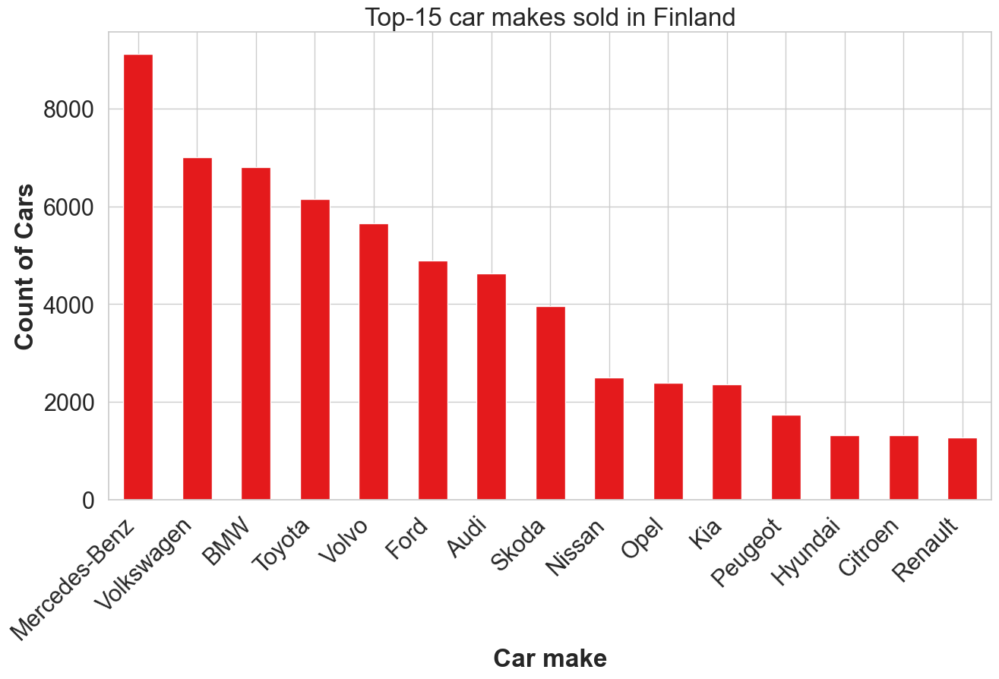

In [617]:
plt.rcParams['figure.figsize'] = [15, 8]
ax = data['car_make'].value_counts().head(15).plot(kind='bar',stacked=True, colormap = 'Set1')
ax.title.set_text('Top-15 car makes sold in Finland')
plt.xlabel("Car make",fontweight = 'bold')
plt.ylabel("Count of Cars",fontweight = 'bold')
plt.xticks(rotation=45, ha='right');

Most popular models are:

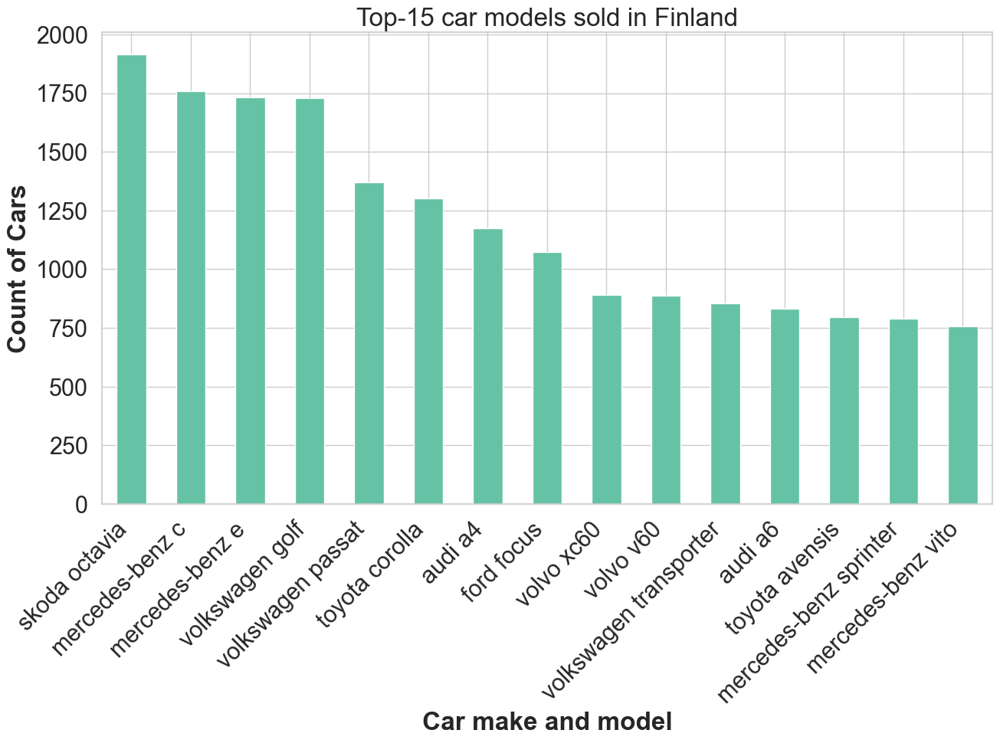

In [618]:
plt.rcParams['figure.figsize'] = [15, 8]
ax = data['make_model'].value_counts().head(15).plot(kind='bar',stacked=True, colormap = 'Set2')
ax.title.set_text('Top-15 car models sold in Finland')
plt.xlabel("Car make and model",fontweight = 'bold')
plt.ylabel("Count of Cars",fontweight = 'bold')
plt.xticks(rotation=45, ha='right');

Surprisingly Skoda Octavia is the leader on the used car market. Also there is no single BMW in the top 15 sold car models.

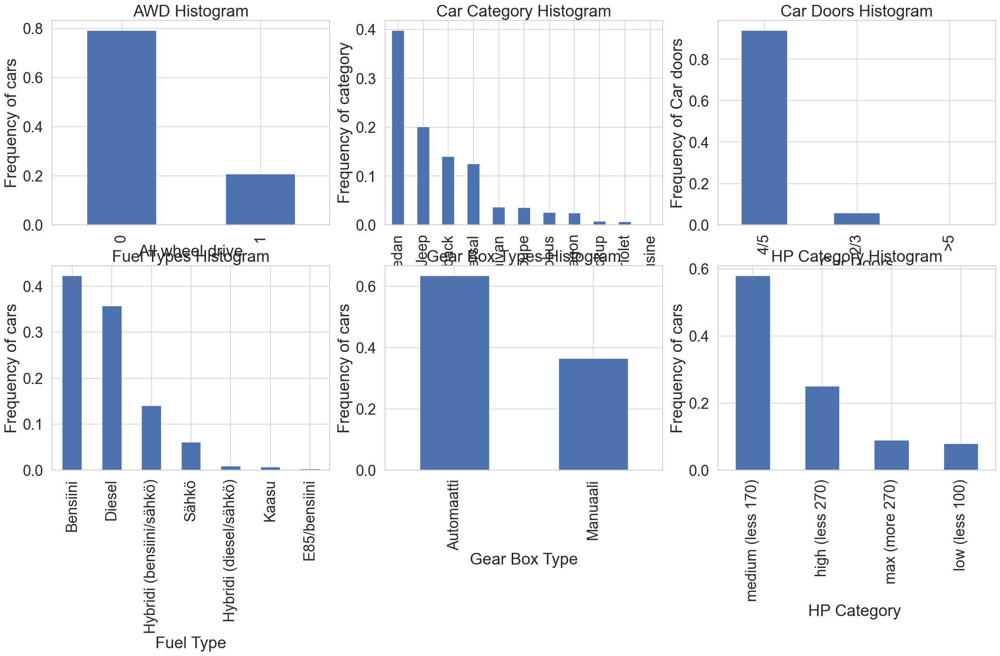

In [619]:
plt.figure(figsize=(25, 12))

plt.subplot(2,3,1)
plt1 = data.awd.value_counts(normalize=True).plot(kind='bar')
plt.title('AWD Histogram')
plt1.set(xlabel = 'All wheel drive', ylabel='Frequency of cars')

plt.subplot(2,3,2)
plt1 = data.category.value_counts(normalize=True).plot(kind='bar')
plt.title('Car Category Histogram')
plt1.set(xlabel = 'Category', ylabel='Frequency of category')

plt.subplot(2,3,3)
plt1 = data.doors.value_counts(normalize=True).plot(kind='bar')
plt.title('Car Doors Histogram')
plt1.set(xlabel = 'Car Doors', ylabel='Frequency of Car doors')

plt.subplot(2,3,4)
plt1 = data.fuel_type.value_counts(normalize=True).plot(kind='bar')
plt.title('Fuel Types Histogram')
plt1.set(xlabel = 'Fuel Type', ylabel='Frequency of cars')

plt.subplot(2,3,5)
plt1 = data.gearbox_type.value_counts(normalize=True).plot(kind='bar')
plt.title('Gear Box Types Histogram')
plt1.set(xlabel = 'Gear Box Type', ylabel='Frequency of cars')

plt.subplot(2,3,6)
plt1 = data.hp_cat.value_counts(normalize=True).plot(kind='bar')
plt.title('HP Category Histogram')
plt1.set(xlabel = 'HP Category ', ylabel='Frequency of cars')

plt.show()

Inference:
- only each 5th car is AWD
- 1 out of 3 cars have manual transmission
- 75% of cars are diesel and gasoline. Hybrid and electric cars have only 22% of the market. 
- more than 90% of cars have 4/5 doors
- 60% cars have from 100 to 170 horse power

Now let's review our target parameter in comparison with other features.

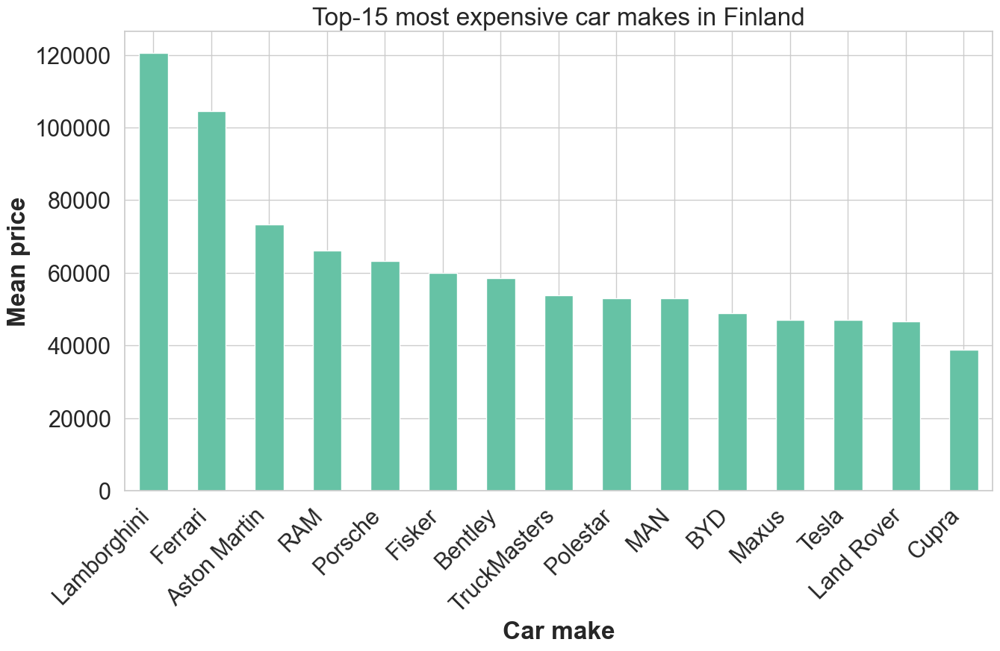

In [620]:
plt.rcParams['figure.figsize'] = [15, 8]
ax = data.groupby(
    'car_make'
)['car_price'].mean().sort_values(ascending=False).head(15).plot(
    kind='bar',stacked=True, colormap = 'Set2')
ax.title.set_text('Top-15 most expensive car makes in Finland')
plt.xlabel("Car make",fontweight = 'bold')
plt.ylabel("Mean price",fontweight = 'bold')
plt.xticks(rotation=45, ha='right');

Car makes that produce highend cars tend to cost more then budget or medium car makes. Which seems obvious.

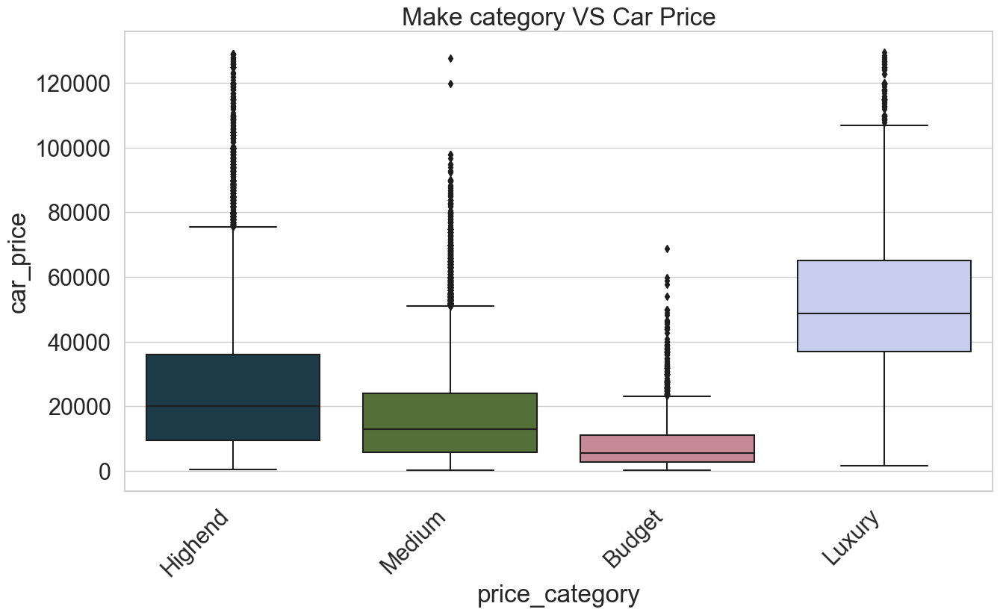

In [621]:
plt.figure(figsize=(15, 8))

plt.title('Make category VS Car Price')
sns.boxplot(x=data.price_category, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'Price category', ylabel='Car price')
plt.xticks(rotation=45, ha='right');

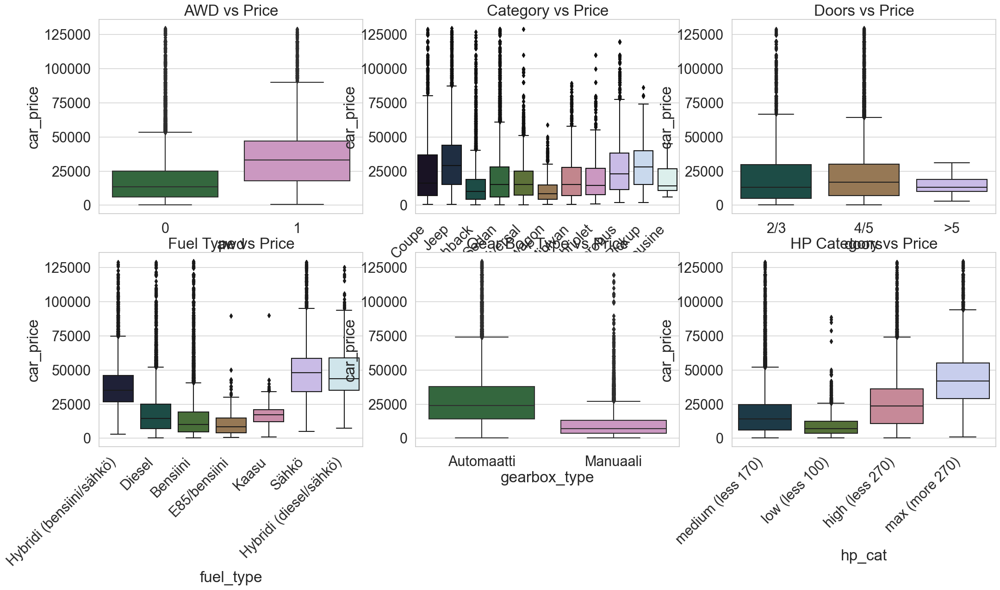

In [622]:
plt.figure(figsize=(25, 12))

plt.subplot(2,3,1)
plt.title('AWD vs Price')
sns.boxplot(x=data.awd, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'All wheel drive', ylabel='Price')

plt.subplot(2,3,2)
plt.title('Category vs Price')
sns.boxplot(x=data.category, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'Category', ylabel='Price')
plt.xticks(rotation=45, ha='right');

plt.subplot(2,3,3)
plt.title('Doors vs Price')
sns.boxplot(x=data.doors, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'Car Doors', ylabel='Price')

plt.subplot(2,3,4)
plt.title('Fuel Type vs Price')
sns.boxplot(x=data.fuel_type, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'Fuel Type', ylabel='Price')
plt.xticks(rotation=45, ha='right');

plt.subplot(2,3,5)
plt.title('Gear Box Type vs Price')
sns.boxplot(x=data.gearbox_type, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'Gear Box Type', ylabel='Price')

plt.subplot(2,3,6)
plt.title('HP Category vs Price')
sns.boxplot(x=data.hp_cat, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'HP Category', ylabel='Price')

plt.xticks(rotation=45, ha='right');
plt.show()

Inference:
- Cars with AWD cost more than FWR or RWD cars
- Price for jeeps, pickups and microbuses is higher than for other categories
- There is no significant difference between 2/3 and 4/5 doors cars pricing
- Horse powers are in direct ratio with car price. More horse power means more expensive car

Hybrid and electric cars price is higher probably due to the fact that technology is rather new and cars having electric engines are younger than cars with internal combustion engines (let's check it)

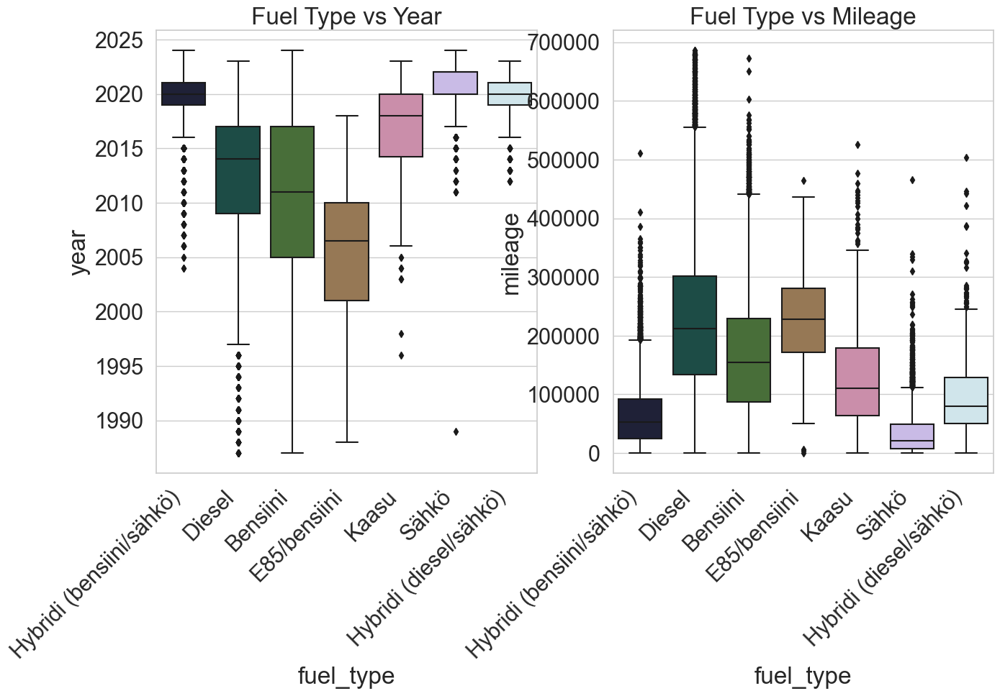

In [623]:
plt.figure(figsize=(15, 8))

plt.subplot(1,2,1)
plt.title('Fuel Type vs Year')
sns.boxplot(x=data.fuel_type, y=data.year, palette=("cubehelix"))
plt1.set(xlabel = 'Fuel Type', ylabel='Year')
plt.xticks(rotation=45, ha='right');

plt.subplot(1,2,2)
plt.title('Fuel Type vs Mileage')
sns.boxplot(x=data.fuel_type, y=data.mileage, palette=("cubehelix"))
plt1.set(xlabel = 'Fuel Type', ylabel='Mileage')
plt.xticks(rotation=45, ha='right');

plt.show()

Yes, our assumption was correct: electric and hybrid cars have appeared in 21 century therefore such cars are younger and less driven so median price for them is higher. 

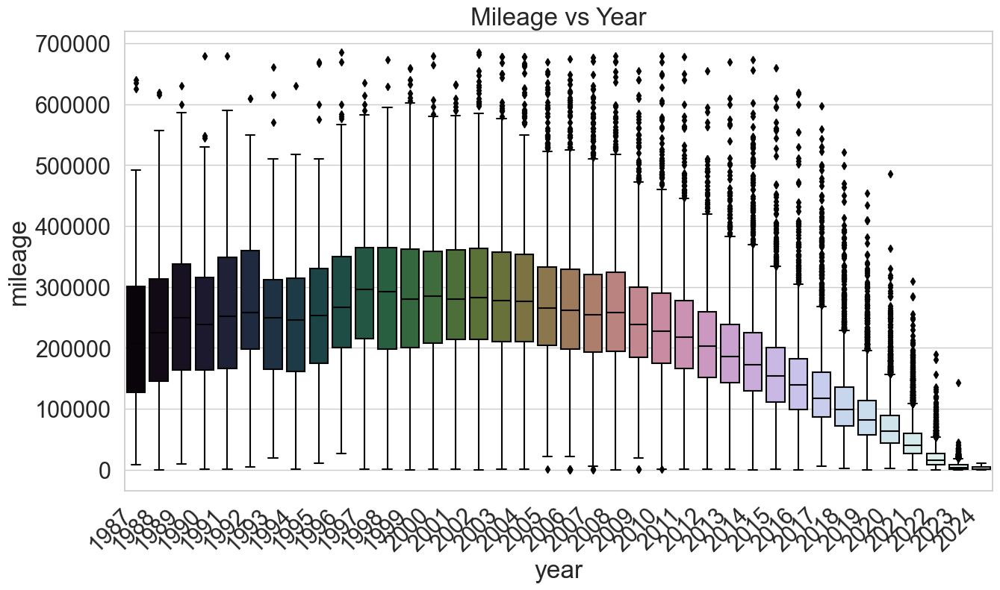

In [624]:
plt.figure(figsize=(15, 8))
plt.title('Mileage vs Year')
sns.boxplot(x=data.year, y=data.mileage, palette=("cubehelix"))
plt1.set(xlabel = 'Year', ylabel='Mileage in km')
plt.xticks(rotation=45, ha='right');

It seems logically correct that older cars have more mileage. However, we can see such trend only after 1997-2001. Cars produced before 1997 sometimes have fewer km on odometer in comparison to year 2000. 

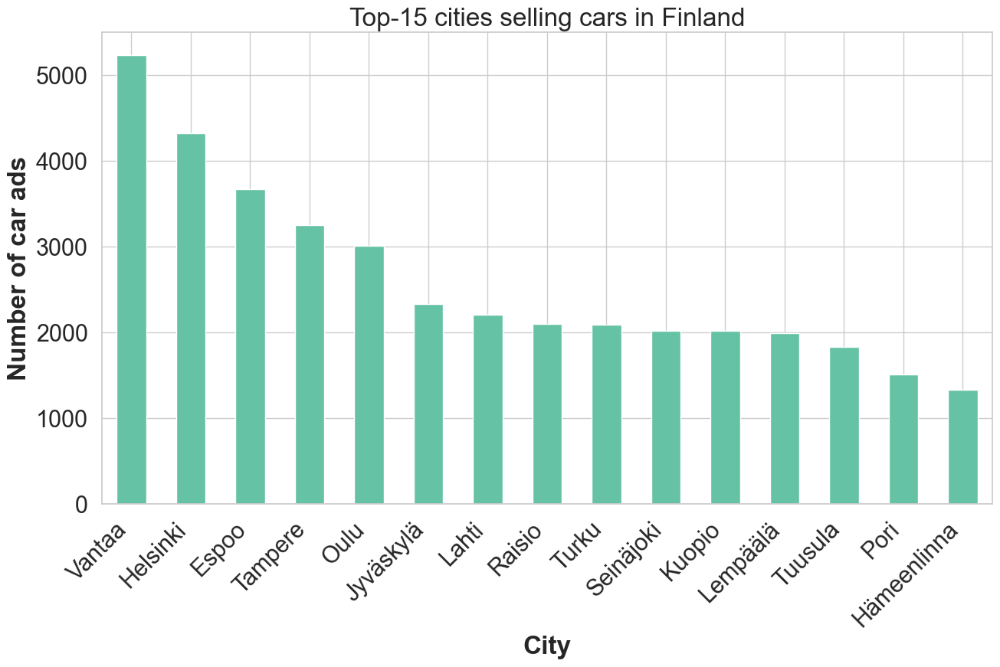

In [625]:
plt.rcParams['figure.figsize'] = [15, 8]
ax = data.groupby(
    by='town')['year'].count().sort_values(
    ascending=False).head(15).plot(
    kind='bar',stacked=True, colormap = 'Set2')
ax.title.set_text('Top-15 cities selling cars in Finland')
plt.xlabel("City",fontweight = 'bold')
plt.ylabel("Number of car ads",fontweight = 'bold')
plt.xticks(rotation=45, ha='right');

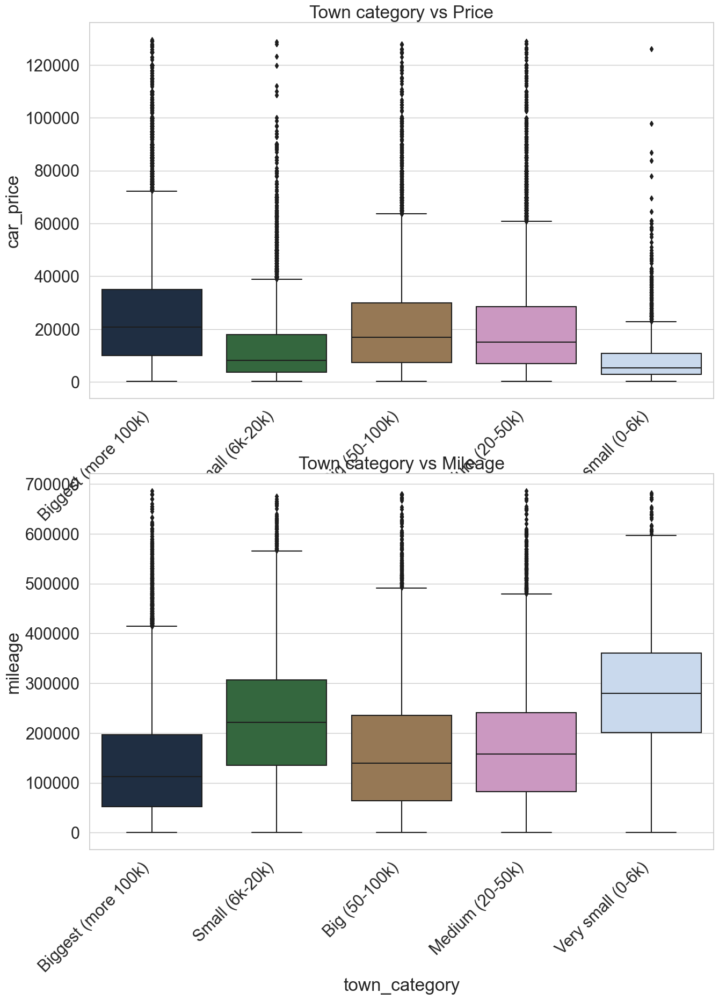

In [626]:
plt.figure(figsize=(15, 20))

plt.subplot(2,1,1)
plt.title('Town category vs Price')
sns.boxplot(x=data.town_category, y=data.car_price, palette=("cubehelix"))
plt1.set(xlabel = 'Town Category', ylabel='Car price')
plt.xticks(rotation=45, ha='right');

plt.subplot(2,1,2)
plt.title('Town category vs Mileage')
sns.boxplot(x=data['town_category'], y=data['mileage'], palette=("cubehelix"))
plt1.set(xlabel = 'Town category', ylabel='Mileage')
plt.xticks(rotation=45, ha='right');

We can see that bigger cities have more expensive cars. But cars in smaller cities usually have bigger mileage. Town category seems important in terms of price prediction.

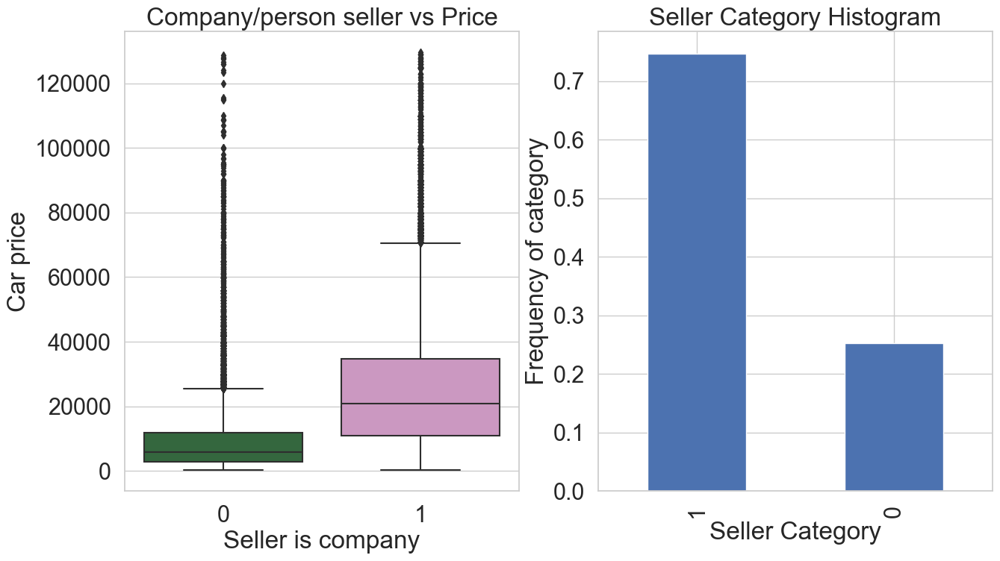

In [627]:
plt.figure(figsize=(15, 8))


plt.subplot(1,2,1)
plt1 = sns.boxplot(x=data.is_company, y=data.car_price, palette=("cubehelix"))
plt.title('Company/person seller vs Price')
plt1.set(xlabel = 'Seller is company', ylabel='Car price')

plt.subplot(1,2,2)
plt1 = data.is_company.value_counts(normalize=True).plot(kind='bar')
plt.title('Seller Category Histogram')
plt1.set(xlabel = 'Seller Category', ylabel='Frequency of category')

plt.show();

Approximately 75% of cars are sold by car selling companies, rest are sold by private individuals. However, individuals usually sell cars cheaper as car selling companies add their comission to the final price that makes car more expensive.

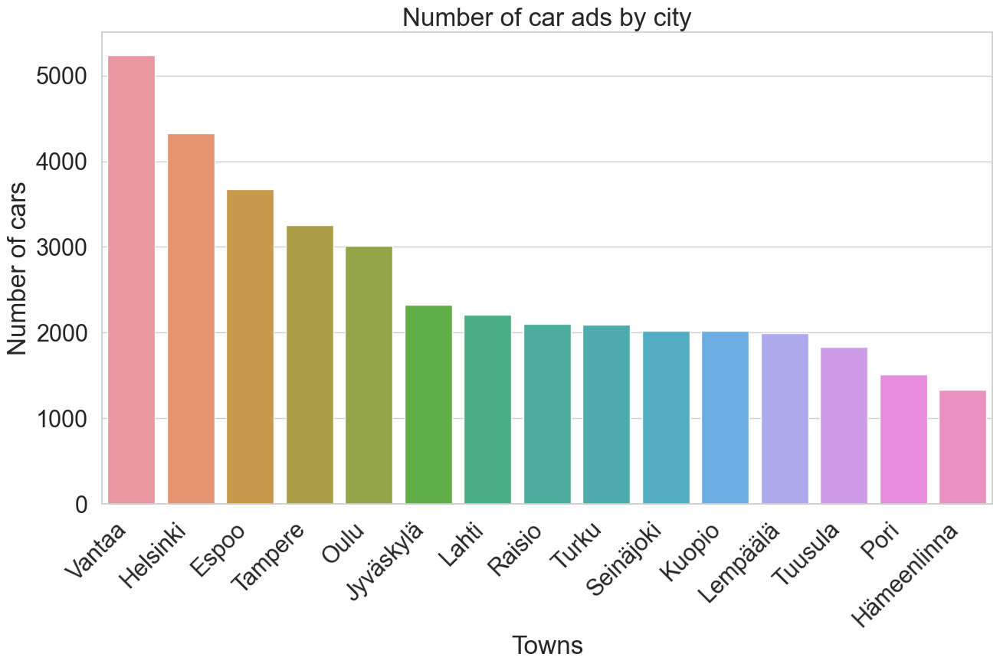

In [628]:
top_towns = data.groupby(
    by='town', as_index=False)['year'].count().sort_values(
    by='year', 
    ascending=False).head(15)

plt.figure(figsize=(15, 8))

plt.title('Number of car ads by city')
ax1=sns.barplot(top_towns, x='town', y='year')
ax1.set(xlabel = 'Towns', ylabel='Number of cars')
plt.xticks(rotation=45, ha='right');


plt.show()

<Figure size 1500x800 with 0 Axes>

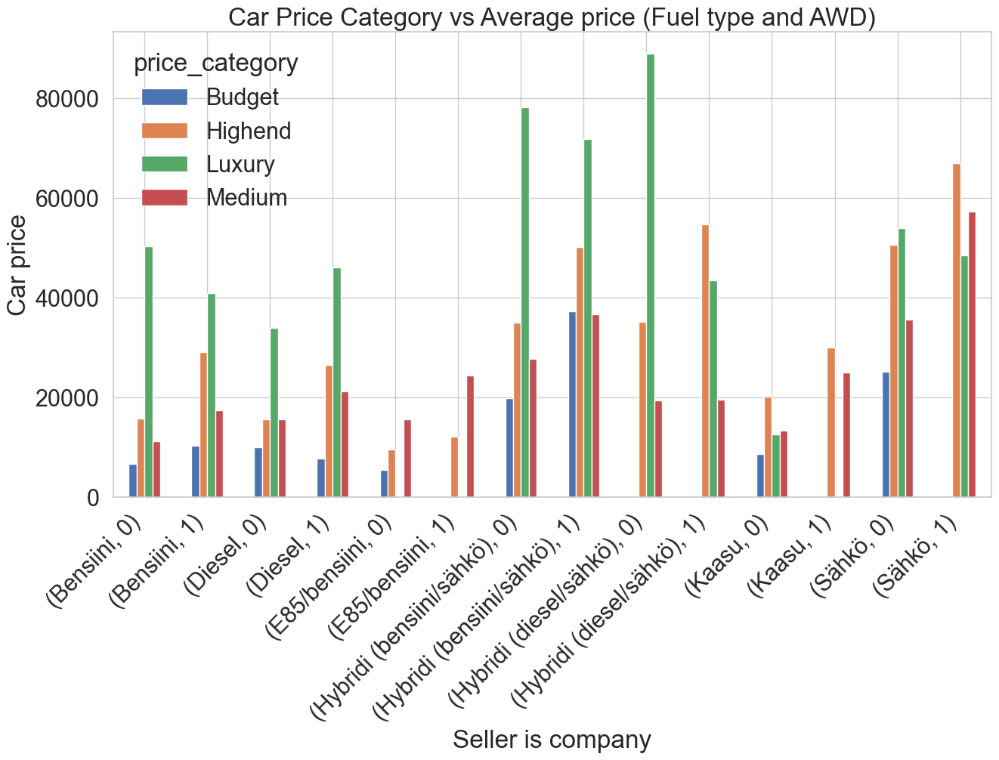

In [629]:
plt.figure(figsize=(15, 8))

plt1 = pd.DataFrame(data.groupby(['fuel_type','awd','price_category'])['car_price'].mean().unstack(fill_value=0)).plot.bar()
plt1.set(xlabel = 'Seller is company', ylabel='Car price')
plt.title('Car Price Category vs Average price (Fuel type and AWD)')
plt.xticks(rotation=45, ha='right');

plt.show();

<Figure size 1500x800 with 0 Axes>

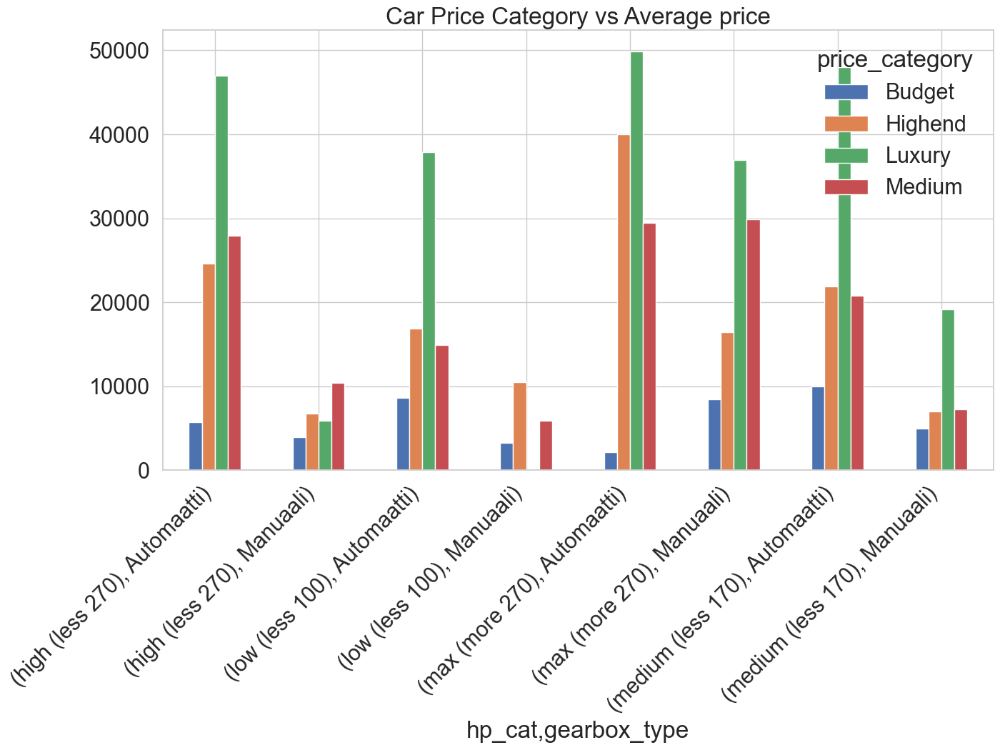

In [630]:
plt.figure(figsize=(15, 8))

df = pd.DataFrame(data.groupby(['hp_cat','gearbox_type', 'price_category'])['car_price'].median().unstack(fill_value=0))
df.plot.bar()
plt.title('Car Price Category vs Average price')
plt.xticks(rotation=45, ha='right');
plt.show();

Inference:
- luxury cars are not produced with low hp and manual gearbox
- luxury cars prefer hybrids

As result of categorical features analysis, in my opinion the following have strong influence on target variable:
- AWD
- Category
- HP
- Fuel type
- Gearbox type
- HP category
- Price category
- Town category
- Is company

Moving on. Now we can proceed to numerical features.

In [631]:
num_col = data.select_dtypes(exclude=['object']).columns
data_num = data[num_col].drop(columns='awd')

/Users/egor/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


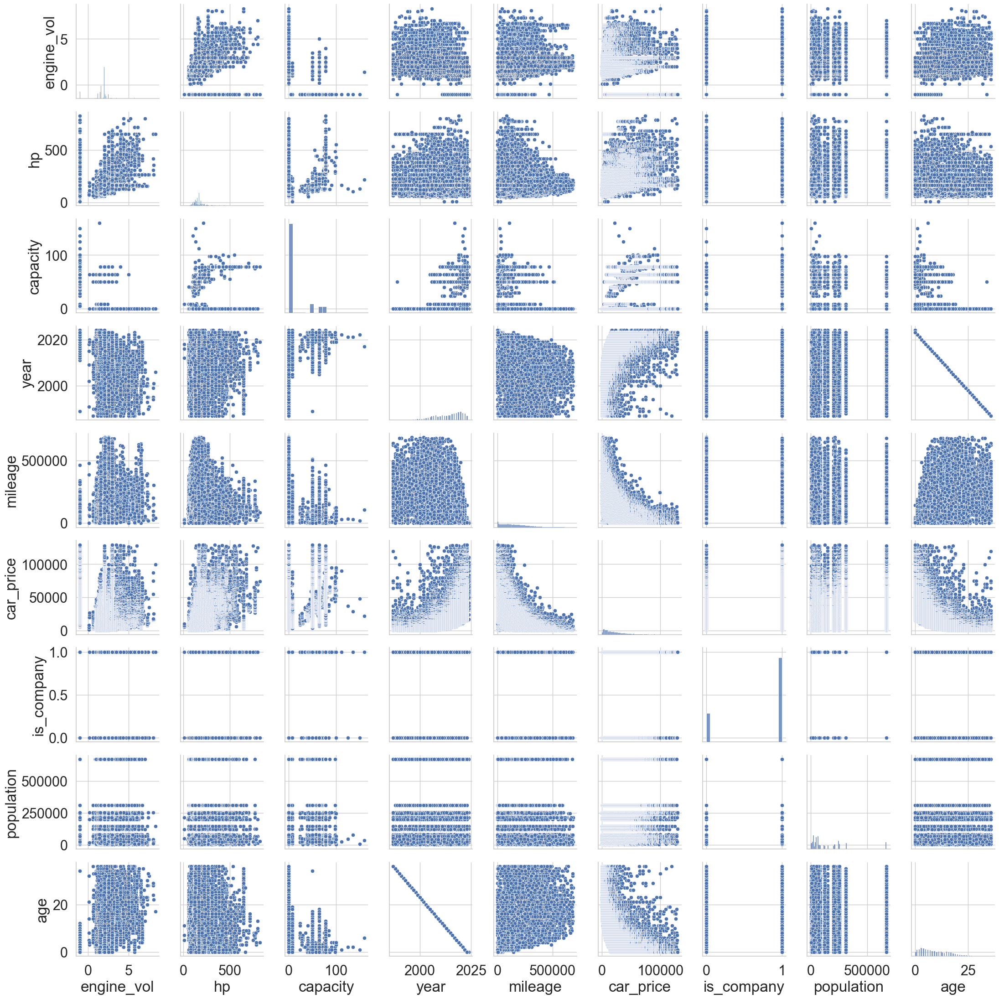

In [632]:
ax = sns.pairplot(data_num);

Inference:
- engine_vol, hp, capacity and age seems to have a positive correlation with price. 
- mileage has negative correlation with price. 

In [633]:
data['manual_gearbox'] = data['gearbox_type'].apply(lambda x: 1 if x=='Manuaali' else 0)
data = data.drop(columns=['year', 'gearbox_type'])

In [634]:
data.to_csv('/Users/egor/Documents/data_science_course/project_7/data/data_final.csv')

In [635]:
data = pd.read_csv('/Users/egor/Documents/data_science_course/project_7/data/data_final.csv', index_col=0)

In [636]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 71878 entries, 0 to 72952
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   engine_vol      71878 non-null  float64
 1   car_make        71878 non-null  object 
 2   model           71878 non-null  object 
 3   make_model      71878 non-null  object 
 4   awd             71878 non-null  int64  
 5   category        71878 non-null  object 
 6   doors           71878 non-null  object 
 7   hp              71878 non-null  int64  
 8   capacity        71878 non-null  int64  
 9   mileage         71878 non-null  int64  
 10  fuel_type       71878 non-null  object 
 11  town            71878 non-null  object 
 12  car_seller      71878 non-null  object 
 13  car_price       71878 non-null  int64  
 14  hp_cat          71878 non-null  object 
 15  price_category  71878 non-null  object 
 16  is_company      71878 non-null  int64  
 17  population      71878 non-null  floa

Here's the final list of features that we use for prediction based on visual analysis:
- engine_vol
- awd
- category
- hp
- capacity
- age
- mileage
- fuel_type
- gearbox_type
- hp_cat
- price_category
- town_category
- is_company

In [692]:
data_lr = data[[
    'engine_vol',
    'awd', 
    'category',
    'hp',
    'capacity',
    'age',
    'mileage',
    'fuel_type',
    'manual_gearbox',
    'hp_cat',
    'price_category',
    'town_category',
    'is_company',
    'car_price'
]].reset_index(drop=True)

In [693]:
data_lr.shape

(71878, 14)

In [694]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
data_lr_num_cols = list(data_lr.select_dtypes(include=numerics).columns)
data_lr_cat_cols = list(data_lr.select_dtypes(exclude=numerics).columns)

In [695]:
ohe_lr = OneHotEncoder(handle_unknown='ignore', sparse_output = False)
ohe_lr.fit(data_lr[data_lr_cat_cols])
data_lr_ohe = ohe_lr.transform(data_lr[data_lr_cat_cols])
data_lr_ohe = pd.DataFrame(data_lr_ohe, columns = ohe_lr.get_feature_names_out(input_features = data_lr_cat_cols))
data_lr_ohe.head()

,category_Cabriolet,category_Coupe,category_Goods wagon,category_Hatchback,category_Jeep,category_Limousine,category_Microbus,category_Minivan,category_Pickup,category_Sedan,...,hp_cat_medium (less 170),price_category_Budget,price_category_Highend,price_category_Luxury,price_category_Medium,town_category_Big (50-100k),town_category_Biggest (more 100k),town_category_Medium (20-50k),town_category_Small (6k-20k),town_category_Very small (0-6k)
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0


In [696]:
data_lr = data_lr.drop(list(data_lr_cat_cols), axis=1)
data_lr = pd.concat([data_lr, data_lr_ohe], axis=1)
data_lr.shape

(71878, 40)

## Train/test splitting and data scaling

In [698]:
X = data_lr.drop(columns=['car_price'])
y = data_lr['car_price']

num_features = ['engine_vol', 'hp', 'capacity', 'age', 'mileage']
scaler = MinMaxScaler()
X[num_features] = scaler.fit_transform(X[num_features])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    train_size=0.7, 
    random_state=42)

X_test, X_val, y_test, y_val = train_test_split(
    X_test, y_test, 
    train_size=0.5, 
    random_state=42)

### Correlation matrix

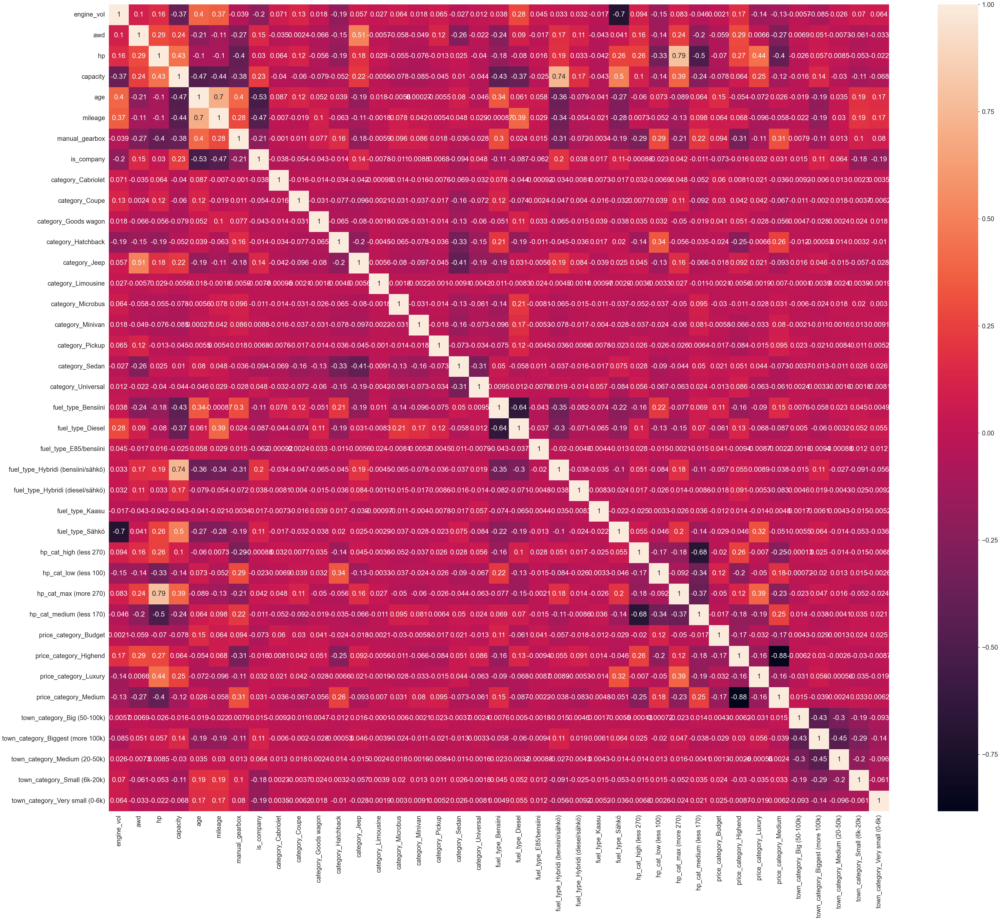

In [699]:
plt.figure(figsize = (60, 50))
sns.heatmap(X.corr(), annot = True)
plt.show()

In [700]:
corr = X.corr()
corr_unstack = corr.abs().unstack().reset_index()
corr_unstack = corr_unstack.sort_values(by=[0], ascending = False)
mask = corr_unstack['level_0'] != corr_unstack['level_1']
corr_unstack = corr_unstack[mask]
corr_unstack['pr1'] = corr_unstack['level_0'] + corr_unstack['level_1']
corr_unstack['pr1'] = corr_unstack['pr1'].apply(lambda x: ''.join(sorted(list(x))))
corr_unstack = corr_unstack.drop_duplicates(subset=['pr1'])
corr_unstack = corr_unstack.drop(['pr1'], axis=1)
print('Features with highest correlation')
corr_unstack.head(20)

Features with highest correlation


,level_0,level_1,0
1242,price_category_Highend,price_category_Medium,0.882778
106,hp,hp_cat_max (more 270),0.789597
139,capacity,fuel_type_Hybridi (bensiini/sähkö),0.741221
975,fuel_type_Sähkö,engine_vol,0.701984
199,mileage,age,0.700368
1043,hp_cat_high (less 270),hp_cat_medium (less 170),0.680482
761,fuel_type_Bensiini,fuel_type_Diesel,0.637996
277,is_company,age,0.528694
469,category_Jeep,awd,0.511944
107,hp,hp_cat_medium (less 170),0.503697


We don't have features that have high correlation with price

## Model building

### Linear regression (Baseline)

In [701]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

print(f'Mean squared error for train:\n {mean_squared_error(y_train, y_train_pred)}')
print(f'R2 score for train:\n {r2_score(y_train, y_train_pred)}')
print()
print(f'Mean squared error for test:\n {mean_squared_error(y_test, y_test_pred)}')
print(f'R2 score for test:\n {r2_score(y_test, y_test_pred)}')

Mean squared error for train:
 93561526.6820368
R2 score for train:
 0.7385865618519314

Mean squared error for test:
 90060907.37135968
R2 score for test:
 0.7378448872256858


### Random Forest

In [710]:
data_mdl = data[[
    'make_model',
    'engine_vol',
    'awd', 
    'category',
    'hp',
    'capacity',
    'age',
    'mileage',
    'fuel_type',
    'manual_gearbox',
    'hp_cat',
    'price_category',
    'town_category',
    'is_company',
    'car_price'
]].reset_index(drop=True)

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
data_mdl_num_cols = list(data_mdl.select_dtypes(include=numerics).columns)
data_mdl_cat_cols = list(data_mdl.select_dtypes(exclude=numerics).columns)
ohe_mdl = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
ohe_mdl.fit(data_mdl[data_mdl_cat_cols])
data_mdl_ohe = ohe_mdl.transform(data_mdl[data_mdl_cat_cols])
data_mdl_ohe = pd.DataFrame(data_mdl_ohe, columns=ohe_mdl.get_feature_names_out(input_features=data_mdl_cat_cols))

data_mdl = data_mdl.drop(list(data_mdl_cat_cols), axis=1)
data_mdl = pd.concat([data_mdl, data_mdl_ohe], axis=1)
data_mdl.shape

(71878, 1263)

In [711]:
#Dumping/Storing the one hot encoding object into a file for later use
dump(ohe_mdl, '/Users/egor/Documents/data_science_course/project_7/models/ohe_mdl.joblib')

['/Users/egor/Documents/data_science_course/project_7/models/ohe_mdl.joblib']

In [716]:
X = data_mdl.drop(columns=['car_price'])
y = data_mdl['car_price']

data_mdl_num_cols.remove('car_price')
scaler = MinMaxScaler()
X[data_mdl_num_cols] = scaler.fit_transform(X[data_mdl_num_cols])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    train_size=0.7, 
    random_state=42)

X_test, X_val, y_test, y_val = train_test_split(
    X_test, y_test, 
    train_size=0.5, 
    random_state=42)

In [717]:
#Dumping/Storing the scaler object into a file for later use
dump(scaler, '/Users/egor/Documents/data_science_course/project_7/models/scaler.joblib')

['/Users/egor/Documents/data_science_course/project_7/models/scaler.joblib']

In [718]:
rf = RandomForestRegressor(
    n_estimators = 100,
    criterion='squared_error',
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train, y_train)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

print(f'Mean squared error for train:\n {mean_squared_error(y_train, y_train_pred)}')
print(f'R2 score for train:\n {r2_score(y_train, y_train_pred)}')
print()
print(f'Mean squared error for test:\n {mean_squared_error(y_test, y_test_pred)}')
print(f'R2 score for test:\n {r2_score(y_test, y_test_pred)}')

Mean squared error for train:
 2843024.3221351686
R2 score for train:
 0.9920565130866914

Mean squared error for test:
 18591286.334010728
R2 score for test:
 0.9458832815728208


In [719]:
feats = {}
for feature, importance in zip(X_train.columns, rf.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
importances

,Features,Gini-Importance
0,age,0.538982
1,hp,0.144317
2,engine_vol,0.109366
3,mileage,0.058380
4,price_category_Luxury,0.014489
...,...,...
1257,make_model_mazda rx-8,0.000000
1258,make_model_mazda mx-3,0.000000
1259,make_model_mazda e-series,0.000000
1260,make_model_mazda b2600,0.000000


### XGBoost

In [721]:
xgb_reg = xgb.XGBRegressor(n_jobs=-1)
xgb_reg.fit(X_train, y_train)

y_train_pred = xgb_reg.predict(X_train)
y_test_pred = xgb_reg.predict(X_test)

print(f'Mean squared error for train:\n {mean_squared_error(y_train, y_train_pred)}')
print(f'R2 score for train:\n {r2_score(y_train, y_train_pred)}')
print()
print(f'Mean squared error for test:\n {mean_squared_error(y_test, y_test_pred)}')
print(f'R2 score for test:\n {r2_score(y_test, y_test_pred)}')

Mean squared error for train:
 16485139.785136651
R2 score for train:
 0.9539400732073404

Mean squared error for test:
 21745647.081149768
R2 score for test:
 0.936701364339994


In [722]:
params = {
    'n_estimators': [100, 200, 500, 750], #no of trees
    'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.25], #eta
    'min_child_weight': [1, 5, 7, 10],
    'gamma': [0.1, 0.5, 1, 1.5, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'max_depth': [3, 4, 5, 10, 12]
}

folds = 5
param_comb = 100
random_search = RandomizedSearchCV(
    xgb_reg, 
    param_distributions=params,
    n_iter=param_comb,
    n_jobs=-1,
    cv=folds,
    verbose=3,
    random_state=42
)

random_search.fit(X_val, y_val)

print('We can get a score of: ', random_search.best_score_, ' using', random_search.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 4/5] END bootstrap=True, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=nan total time=   0.0s
[CV 2/5] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=10, n_estimators=500, subsample=1.0;, score=0.922 total time=   6.4s
[CV 1/5] END colsample_bytree=0.6, gamma=5, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=100, subsample=1.0;, score=0.894 total time=   2.6s


/Users/egor/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 3/5] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800;, score=0.604 total time=   6.2s
[CV 3/5] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000;, score=0.793 total time=  28.7s
[CV 1/5] END bootstrap=True, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200;, score=0.865 total time=  15.4s
[CV 5/5] END colsample_bytree=1.0, gamma=1.5, learning_rate=0.01, max_depth=12, min_child_weight=1, n_estimators=200, subsample=0.6;, score=0.895 total time=   9.5s
[CV 3/5] END bootstrap=False, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600;, score=nan total time=   0.0s
[CV 4/5] END colsample_bytree=1.0, gamma=1.5, learning_rate=0.01, max_depth=12, min_child_weight=1, n_estimators=200, subsample=0.6;, score=0.888 total time=  11.9s
[CV 2/5] END bootstrap=False, max_depth=100, max_f

In [723]:
rs_df = pd.DataFrame(random_search.cv_results_).sort_values('rank_test_score').reset_index(drop=True)
rs_df = rs_df.drop([
            'mean_fit_time', 
            'std_fit_time', 
            'mean_score_time',
            'std_score_time', 
            'params', 
            'split0_test_score', 
            'split1_test_score', 
            'split2_test_score', 
            'split3_test_score',
            'split4_test_score', 
            'std_test_score'],
            axis=1)
rs_df.head(10)

,param_subsample,param_n_estimators,param_min_child_weight,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,mean_test_score,rank_test_score
0,0.6,750,1,10,0.05,1.5,0.8,0.935471,1
1,1.0,750,1,10,0.1,5,0.6,0.933799,2
2,0.6,750,1,10,0.1,0.1,0.8,0.933555,3
3,0.8,750,1,5,0.1,1.5,0.6,0.932672,4
4,0.6,500,1,12,0.02,1,0.8,0.932096,5
5,1.0,750,1,5,0.25,0.1,1.0,0.932037,6
6,1.0,750,1,5,0.1,0.5,0.6,0.930802,7
7,0.8,500,1,10,0.02,0.1,0.6,0.930260,8
8,1.0,500,1,10,0.25,5,1.0,0.930179,9
9,0.8,200,1,10,0.1,1,0.8,0.929752,10


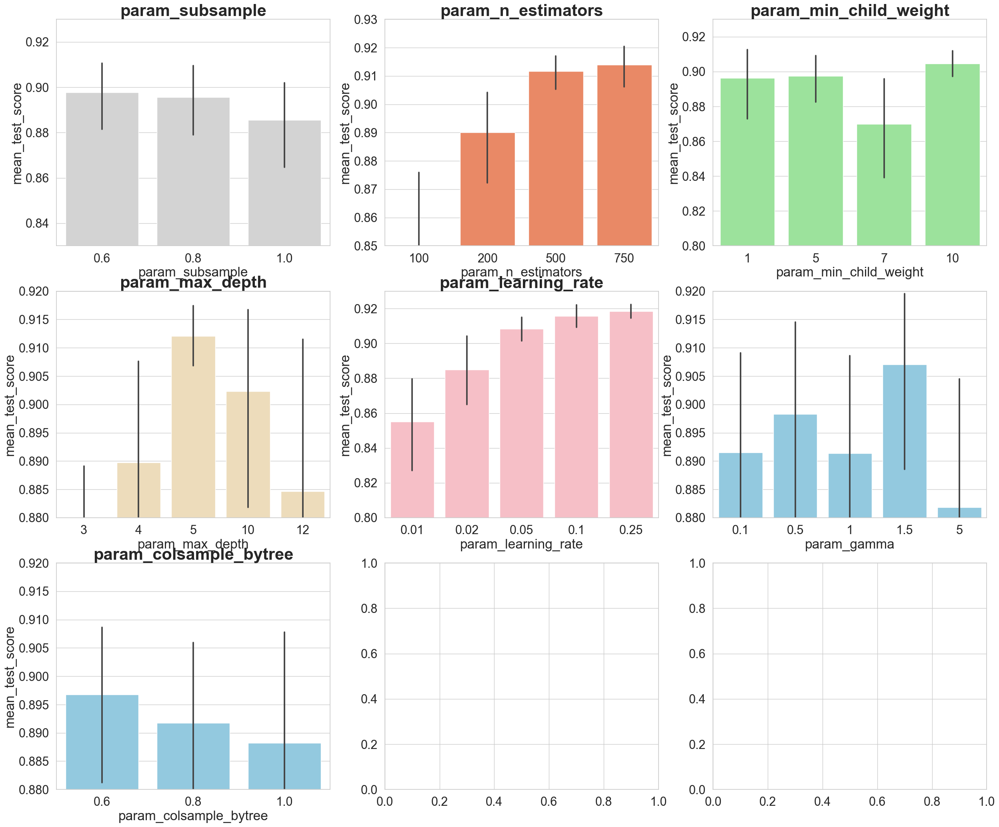

In [724]:
fig, axs = plt.subplots(ncols=3, nrows=3)
sns.set(style="whitegrid", color_codes=True, font_scale = 2)
fig.set_size_inches(30,25)
sns.barplot(x='param_subsample', y='mean_test_score', data=rs_df, ax=axs[0,0], color='lightgrey')
axs[0,0].set_ylim([.83,.93])
axs[0,0].set_title(label = 'param_subsample', size=30, weight='bold')
sns.barplot(x='param_n_estimators', y='mean_test_score', data=rs_df, ax=axs[0,1], color='coral')
axs[0,1].set_ylim([.85,.93])
axs[0,1].set_title(label = 'param_n_estimators', size=30, weight='bold')
sns.barplot(x='param_min_child_weight', y='mean_test_score', data=rs_df, ax=axs[0,2], color='lightgreen')
axs[0,2].set_ylim([.80,.93])
axs[0,2].set_title(label = 'param_min_child_weight', size=30, weight='bold')
sns.barplot(x='param_max_depth', y='mean_test_score', data=rs_df, ax=axs[1,0], color='wheat')
axs[1,0].set_ylim([.88,.92])
axs[1,0].set_title(label = 'param_max_depth', size=30, weight='bold')
sns.barplot(x='param_learning_rate', y='mean_test_score', data=rs_df, ax=axs[1,1], color='lightpink')
axs[1,1].set_ylim([.80,.93])
axs[1,1].set_title(label = 'param_learning_rate', size=30, weight='bold')
sns.barplot(x='param_gamma',y='mean_test_score', data=rs_df, ax=axs[1,2], color='skyblue')
axs[1,2].set_ylim([.88,.92])
axs[2,0].set_title(label = 'param_gamma', size=30, weight='bold')
sns.barplot(x='param_colsample_bytree',y='mean_test_score', data=rs_df, ax=axs[2,0], color='skyblue')
axs[2,0].set_ylim([.88,.92])
axs[2,0].set_title(label = 'param_colsample_bytree', size=30, weight='bold')
plt.show()

In [725]:
param_grid = {
    'n_estimators': [500, 750], #no of trees
    'learning_rate': [0.1, 0.25], #eta
    'min_child_weight': [1, 10],
    'gamma': [0.5, 1.5],
    'subsample': [0.6, 0.8],
    'colsample_bytree': [0.6, 1.0],
    'max_depth': [5, 6]
}

gs = GridSearchCV(xgb_reg, param_grid, cv=3, verbose=3, n_jobs=-1)
gs.fit(X_train, y_train)
xgb_reg_gs = gs.best_estimator_
gs.best_params_

Fitting 3 folds for each of 128 candidates, totalling 384 fits
[CV 2/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_depth=4, min_child_weight=10, n_estimators=750, subsample=0.6;, score=0.920 total time=   8.4s
[CV 4/5] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=750, subsample=0.8;, score=0.912 total time=   6.4s
[CV 1/3] END colsample_bytree=0.6, gamma=0.5, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, subsample=0.8;, score=0.941 total time=  20.3s


/Users/egor/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 4/5] END colsample_bytree=1.0, gamma=1, learning_rate=0.05, max_depth=4, min_child_weight=5, n_estimators=500, subsample=1.0;, score=0.908 total time=   5.7s
[CV 4/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_depth=4, min_child_weight=10, n_estimators=750, subsample=0.6;, score=0.913 total time=   8.4s
[CV 3/5] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=750, subsample=0.8;, score=0.900 total time=   6.4s
[CV 3/3] END colsample_bytree=0.6, gamma=0.5, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, subsample=0.6;, score=0.943 total time=  20.3s
[CV 2/5] END colsample_bytree=1.0, gamma=1, learning_rate=0.05, max_depth=4, min_child_weight=5, n_estimators=500, subsample=1.0;, score=0.912 total time=   5.8s
[CV 3/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_depth=4, min_child_weight=10, n_estimators=750, subsample=0.6;, score=0.907 total time=   8.6s
[CV 2/5] END colsam

{'colsample_bytree': 0.6,
 'gamma': 0.5,
 'learning_rate': 0.25,
 'max_depth': 6,
 'min_child_weight': 1,
 'n_estimators': 750,
 'subsample': 0.8}

In [726]:
y_train_pred = xgb_reg_gs.predict(X_train)
y_test_pred = xgb_reg_gs.predict(X_test)

print(f'Mean squared error for train:\n {mean_squared_error(y_train, y_train_pred)}')
print(f'R2 score for train:\n {r2_score(y_train, y_train_pred)}')
print()
print(f'Mean squared error for test:\n {mean_squared_error(y_test, y_test_pred)}')
print(f'R2 score for test:\n {r2_score(y_test, y_test_pred)}')

Mean squared error for train:
 7213775.135330755
R2 score for train:
 0.9798445170036337

Mean squared error for test:
 14938998.38841935
R2 score for test:
 0.9565145974923098


In [729]:
#Dumping/Storing the model object into a file for later use
dump(xgb_reg_gs, '/Users/egor/Documents/data_science_course/project_7/models/xgb_reg_gs.joblib')

['/Users/egor/Documents/data_science_course/project_7/models/xgb_reg_gs.joblib']

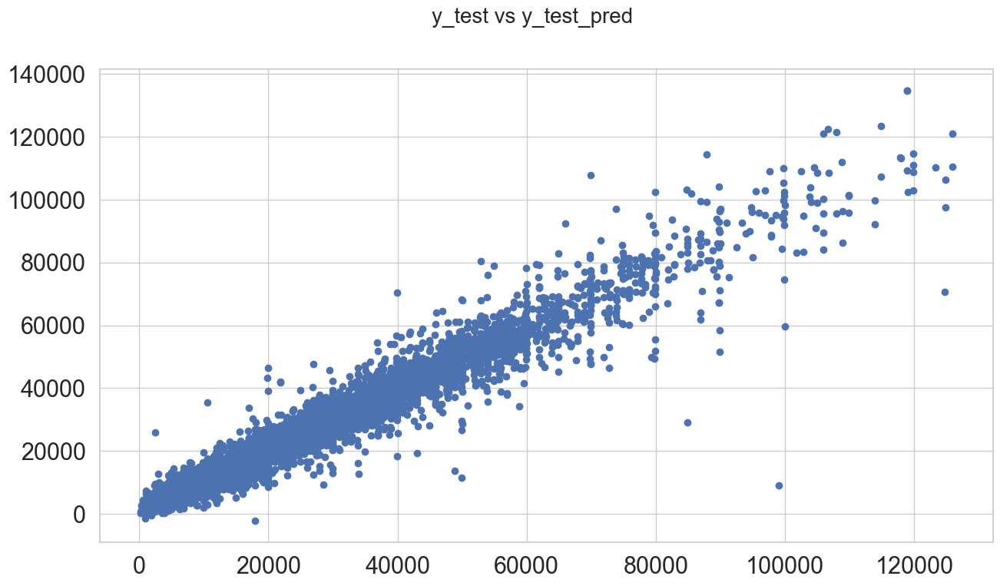

In [727]:
fig = plt.figure()
fig.suptitle('y_test vs y_test_pred', fontsize=20)
plt.scatter(y_test, y_test_pred)